# Predicting the success of a bank marketing campaign using machine learning

## Motivation

With the growth of media and technology, product information has become easily accessible to us. Whether this is through the telephone, television or other channels. However, companies are increasingly using these channels and need to stand out from the others. This raises the question: 

**How companies can develop efficient marketing campaigns?**

In this paper, we will explore this question using the example of how banks offer fixed deposit products to their clients through telemarketing campaigns. After having cleaned the data and develop initial descriptive figures, we will examine if there are certain clients who responded particularly well to the campaign. This will be done using unsupervised machine learning techniques, such as dimensionality reduction and clustering. Using supervised machine learning, we aim to find a model that can predict the success of the marketing campaign based on some client features as well as external factors. This could provide guidance for banks on how, where and when to efficiently use their resources to increase closing rates.

## Relevant imports

**Pip installs:**

In [ ]:
#!pip install seaborn
#!pip install imblearn
#!pip install yellowbrick

**Packages:**

In [1]:
import pandas as pd
import numpy as np
from numpy import NaN
import matplotlib.pyplot as plt
import ipywidgets as widgets
import datetime

from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler

import altair as alt
import seaborn as sns

#We had some warnings which where checked and did not matter for our investigation, so:
import warnings
warnings.filterwarnings('ignore')

sns.set()

#Unsupervised ML
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA, NMF
import umap
from sklearn.cluster import KMeans

#Supervised ML
import pickle
import imblearn #for the sampling of the imbalanced dataset
from imblearn.under_sampling import NearMiss #undersampling technique
import itertools


import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler, LabelEncoder,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, ElasticNet, LogisticRegression

import xgboost
from xgboost import plot_importance,XGBClassifier
from xgboost import XGBRegressor
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, balanced_accuracy_score #as a evaluation metric, but is also a default in our case (just used for checking)
from sklearn.ensemble import RandomForestRegressor
import yellowbrick as yb 
from yellowbrick.features import FeatureImportances
import plotly.express as px 
from sklearn.metrics import classification_report

#For Hyperparameter tuning
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer 

#For some tryout:
from sklearn.metrics import mean_squared_error, r2_score
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
from sklearn.model_selection import StratifiedKFold

## Read and clean data

- Load the relevant dataset
- Inspect for missings and how to deal with them
- Outliers and how to deal with them
- Any necessary datatype transformations?

**a. Load data**

In [3]:
#Load the dataset
bank_data = pd.read_csv("bank_marketing.csv", sep=';')

**Note:** Without using ";" as a separator, the csv would not have been read in the right way. When loading the dataset at first (without the separator), it was seen that ";" (semicolon) is a separator for each column. The same accounts for the cell content which has been placed in the last column.

In [4]:
bank_data.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [5]:
#First data insights:
bank_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

**b. Missings**

In [6]:
bank_data.isnull().sum() #No missings are existing here

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

However, we can see from the information in the text-file that some of the variables have the option "unkown". These variables are basically missings, thus we can transform them into "NaN", so that they can be recognized by the pandas dataframe as missings. See for example the variable "job". There is another note in the text-file which hints to the fact, that in the column "pday" (=number of days that passed by after the client was last contacted from a previous campaign), the "999" means that the client was not previously contacted. However, this is not a missings, we just need to keep in mind what this numeric variable means.

In [7]:
#After inspecting the data, we see that we have a lot of "uknown" in the default variable. This variable explain whether a client has credit in default, and we will not focus on such info since there are so many unknown.

#We drop this column
bank_data.drop('default', axis=1, inplace =True)

In [8]:
#Convert the "unknown" into "NaN":
bank_data = bank_data.replace('unknown', NaN)

#Look how many missings we have now:
bank_data.isnull().sum()

age                  0
job                330
marital             80
education         1731
housing            990
loan               990
contact              0
month                0
day_of_week          0
duration             0
campaign             0
pdays                0
previous             0
poutcome             0
emp.var.rate         0
cons.price.idx       0
cons.conf.idx        0
euribor3m            0
nr.employed          0
y                    0
dtype: int64

In [9]:
#Delete missings:
bank_data_clean = bank_data.dropna(subset=['job', 'marital', 'education', 'housing', 'loan'])

print(f'We reduced the dataset by dropping the missings by: {round((len(bank_data)-len(bank_data_clean))/len(bank_data)*100, 3)} %.')

We reduced the dataset by dropping the missings by: 7.145 %.


**How to deal with the missings?**

For now, we decide to delete the missings.
It does not make sense to perform a mean imputation here, because the missings are only existent in the "string" variables. We could consider other imputation techniques.

**c. Outliers**

0 age
1 duration
2 campaign
3 pdays
4 previous


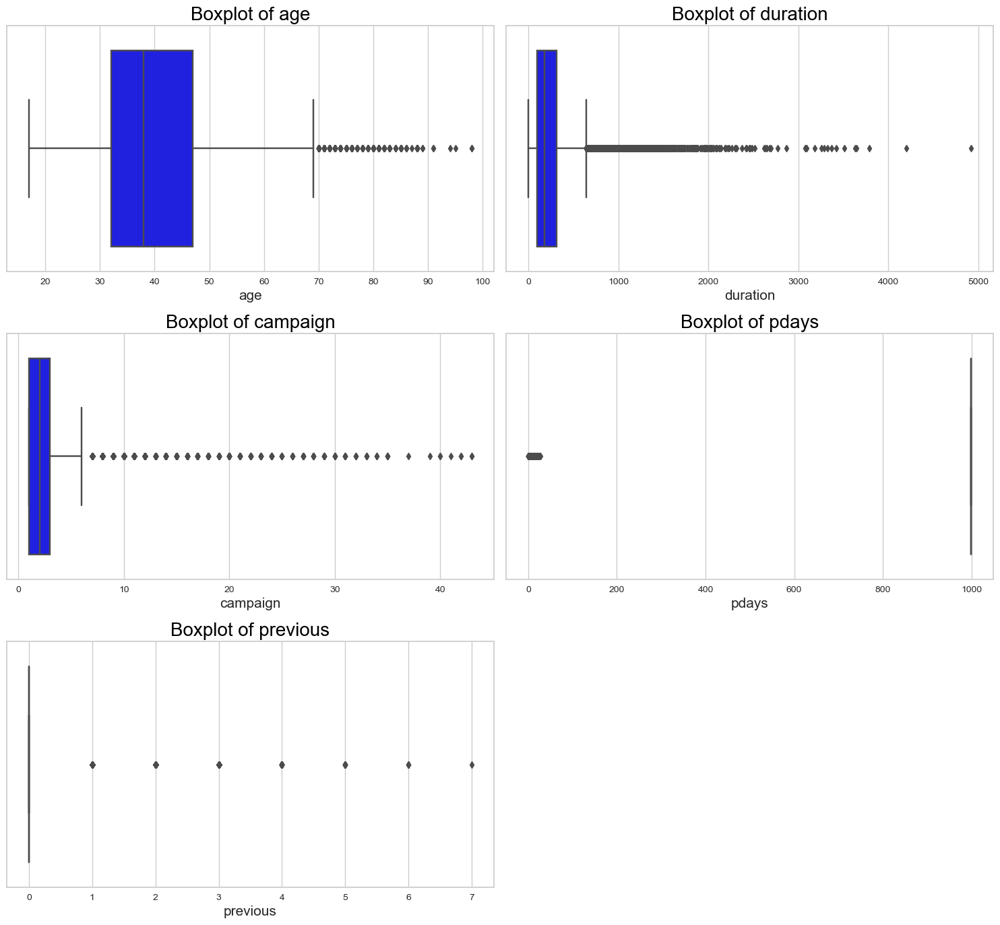

In [10]:
#Select the columns that are categorical
#all_columns = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month','poutcome', 'day_of_week', 'age','duration', 'campaign', 'pdays', 'previous', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'y']
df_num = bank_data_clean[['age', 'duration', 'campaign', 'pdays', 'previous']]
col = ['age', 'duration', 'campaign', 'pdays', 'previous']
plt.figure(figsize=(15,18))
for i,v in enumerate(col):
    print(i,v)
    plt.subplot(4,2,i+1)
    sns.boxplot(x=v,data=df_num,color='Blue')
    plt.title("Boxplot of {}".format(v),size=20,color="Black")
    plt.xlabel("{}".format(v),size=15)
plt.tight_layout()
plt.show()

From the Boxplots above, we investigated the outliers in each in relevant numerical variables. Outliers from the campaign or duration variable could be removed, however this would also delete a lot of data that might actually explain some of the marketing campaign effect for the individual cases. Therefore, we keep all data points for now.  

**d. Tranforming data types?**

In this dataset the day of the week and the months are catgeorical variables. We do not have any year indication. Since we do not want to perform any time series analysis, we decide to keep these variables as categorical variables. Similar, we deal with the other catgorical varibales. However, later on for the machine learning part we will encode the biniary and more dimensional variables. 

## Exploratory Data Analysis

More information on this dataset, can be found in Moro et al. (2014): https://www.sciencedirect.com/science/article/abs/pii/S016792361400061X & https://archive.ics.uci.edu/ml/datasets/bank+marketing

In [11]:
#Save the final dataset:
#bank_data_clean.to_csv("final_data.csv")

In [12]:
bank_data_clean.shape

(38245, 20)

In [13]:
bank_data_clean.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,38245.000000,38245.000000,38245.000000,38245.000000,38245.000000,38245.000000,38245.000000,38245.000000,38245.000000,38245.000000
mean,39.860871,258.207583,2.566662,963.531651,0.170009,0.082861,93.570313,-40.541164,3.623298,5167.432566
std,10.289488,259.792638,2.767473,184.295254,0.487169,1.565945,0.576367,4.623200,1.730226,71.760333
min,17.000000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.000000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.000000,180.000000,2.000000,999.000000,0.000000,1.100000,93.444000,-41.800000,4.857000,5191.000000
75%,47.000000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.000000,4918.000000,43.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


Info on the data in short: 
- 38.245 bank clients (of a Protugese retail bank)
- 20 columns including info on bank client data (more info in the corresponding text-file)

In [15]:
#Make a feature table with explanations
variables_desc = pd.read_csv("variables.csv",sep=';')

variables_desc.to_csv("variables_desc.csv")

### Inspecting categorical varibales

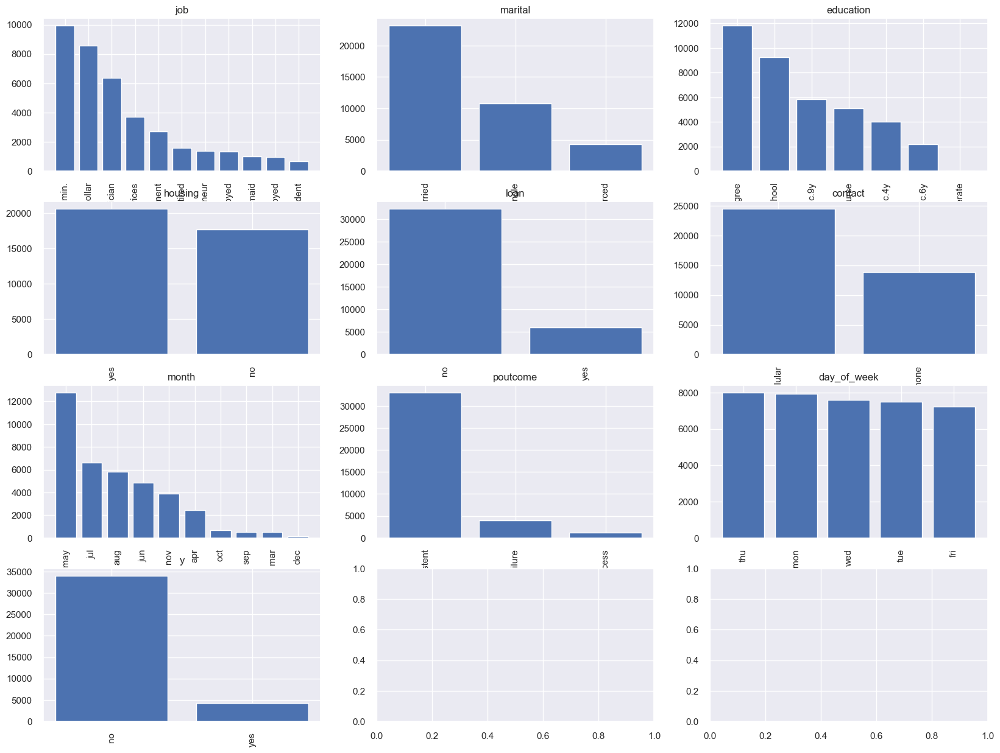

In [54]:
cat_columns = ['job', 'marital', 'education', 'housing', 'loan', 'contact', 'month','poutcome', 'day_of_week', "y"]

fig, axs = plt.subplots(4, 3, sharex=False, sharey=False, figsize=(20, 15))

counter = 0
for cat_column in cat_columns:
    value_counts = bank_data_clean[cat_column].value_counts()
    
    trace_x = counter // 3
    trace_y = counter % 3
    x_pos = np.arange(0, len(value_counts))
    
    axs[trace_x, trace_y].bar(x_pos, value_counts.values, tick_label = value_counts.index)
    
    axs[trace_x, trace_y].set_title(cat_column)
    
    for tick in axs[trace_x, trace_y].get_xticklabels():
        tick.set_rotation(90)
    
    counter += 1

plt.show()

With these plots we get an overall insight in the catgeorical variables. 
Some interesting things are some variables appear quite regularly, such as the day of the week when there was a contact and the whether there was a housing loan. However, we do not know whether there is any difference for age groups or maritial status or if there is any other way to cluster these features based on another feature. Also interesting to see is that most of the clients have been credible people, since the "default" value has no "no", only yes and from before we know there are 8.597 "uknown" or as we labled it, "NaN".


### Inspecting the numerical variables

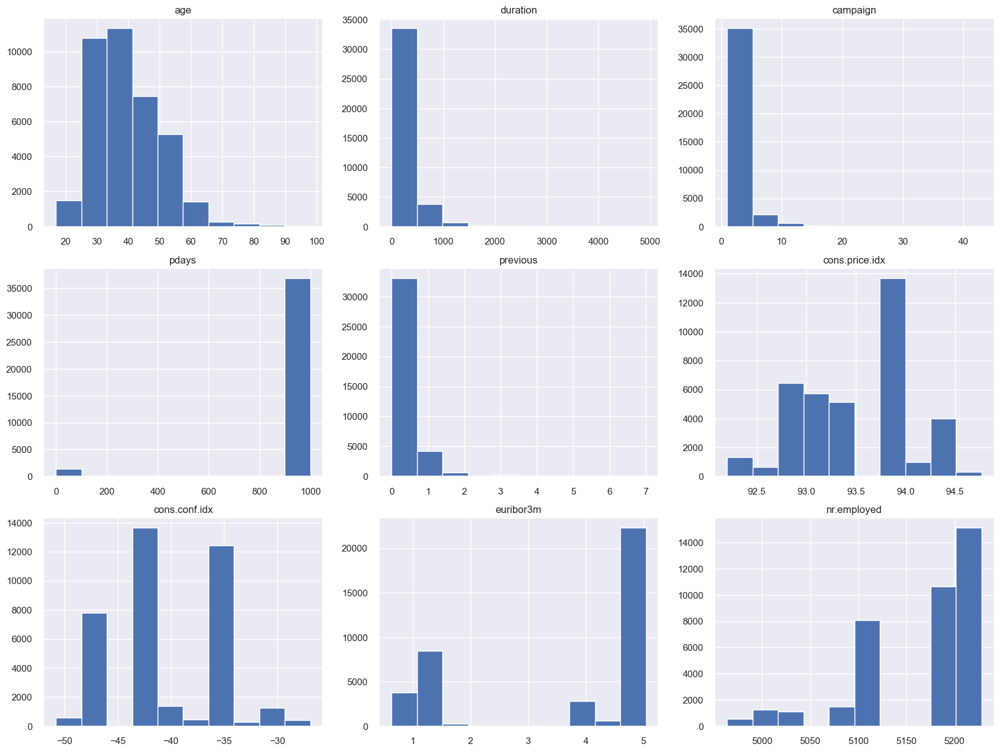

In [55]:
num_columns = ['age','duration', 'campaign', 'pdays', 'previous', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']

fig, axs = plt.subplots(3, 3, sharex=False, sharey=False, figsize=(20, 15))

counter = 0
for num_column in num_columns:
    
    trace_x = counter // 3
    trace_y = counter % 3
    
    axs[trace_x, trace_y].hist(bank_data_clean[num_column])
    
    axs[trace_x, trace_y].set_title(num_column)
    
    counter += 1

plt.show()

Here, we inspect the distribution of the numerical variables. Generally, there are no variables that follow a specific distribution. We see that some variables are quite binary distributed, such as the pdays. Most seem to be "999". According to the text-file this means that most of the clients haven't been previously contacted.

### Correlations

**Now,** we will look into the pairwise linear relationship among the numeric features.

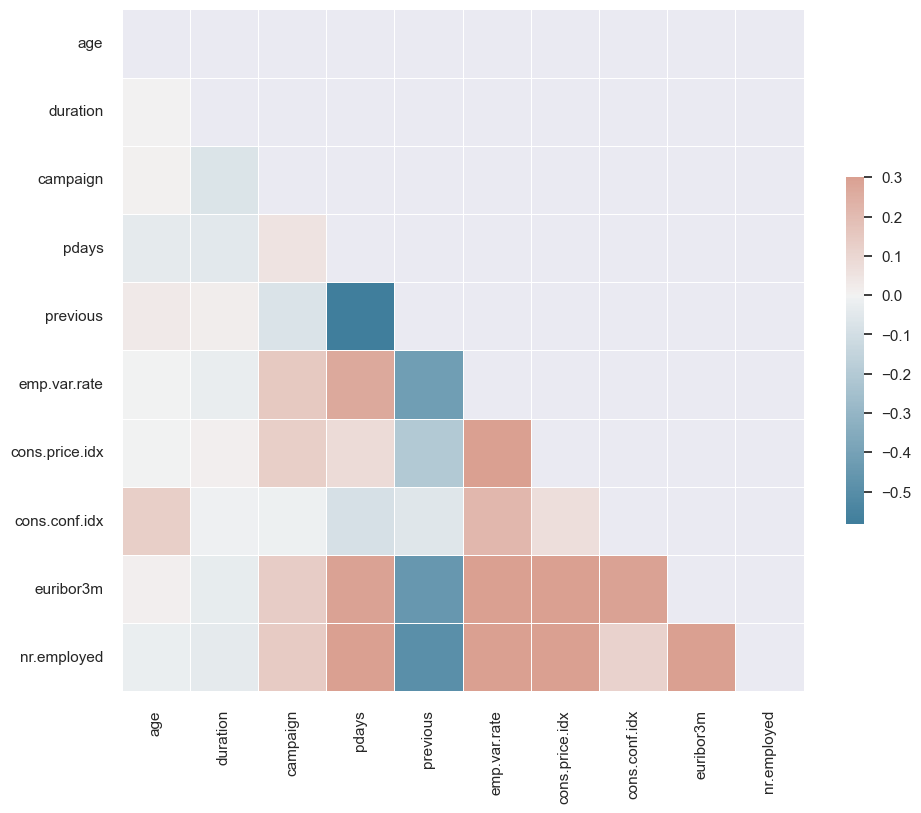

In [56]:
#Quick correlation check

# Compute the correlation matrix
corr = bank_data_clean.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

### Looking into the success rates

**Here,** we try to get a first insight into the success of this marketing campaign.

<AxesSubplot:title={'center':'Successful subscriptions'}, ylabel='y'>

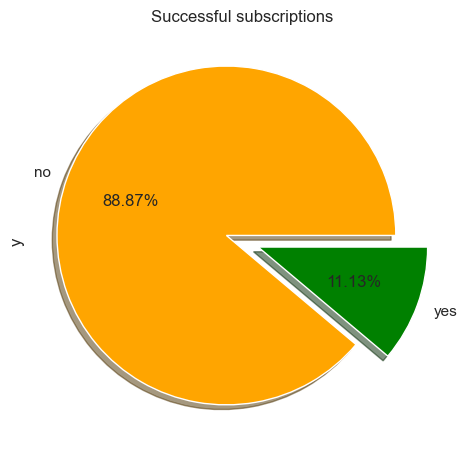

In [57]:
#General success rate in the whole dataset:
value_counts = bank_data_clean['y'].value_counts()

#Predefine some colors: 
colors=['orange', 'green']


value_counts.plot.pie(title = 'Successful subscriptions', colors = colors, shadow=True,explode=(0.1, 0.1), autopct='%1.2f%%')

**Note:** from this we can see, that the data is imbalanced which means that the ratio of the value counts (here: "no") of the class is much higher than the other (here: "yes"). Already on the text-file it has been noted: "Important note: this attribute highly affects the output target (e.g., if duration=0 then y="no"). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model."

By investigating the duration of the calls (is counted in seconds), we hope to be able to exclude some clients that immedietly hung up the phone, and thus some of the "no's". Already from the histogram, we can see that many calls have been particulary short.

We can explore this by the following graph by selection the feature "duration": is there a pattern after some time where more people responded yes?

**Visualize**

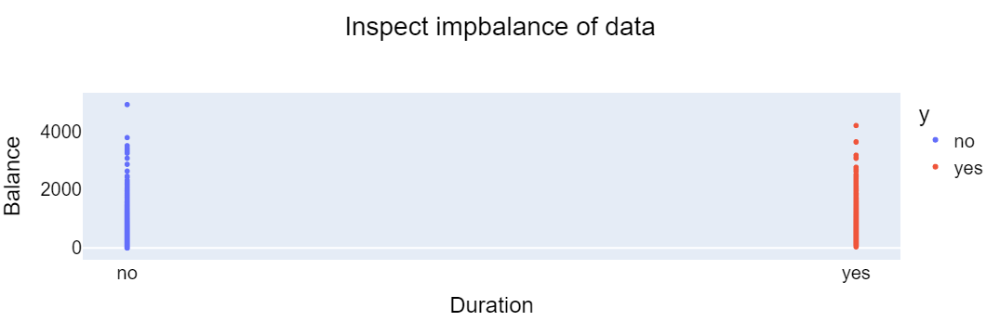

In [190]:
#Define another feature which can be inspected in relation with duration and the success:
#Create the interactive figure:
fig = px.scatter(bank_data_clean, x="y", y="duration", color="y",
                  title="Click on the legend items!")
fig.update_layout(
    title={
         'text': "Inspect impbalance of data",
            'y':0.95,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
    xaxis_title="Duration",
    yaxis_title=" Balance",
    font=dict(
        family="Arial",
        size=20,
        color="black"
    )
)
fig.update_layout(xaxis=dict(showgrid=False),
              yaxis=dict(showgrid=False)
)
fig.show()

After looking trough the duration with the graph above we see that only one person answered with "yes" after 37 seconds, so that means ~30 seconds is already a conservation that could have convinced a client. Since it is quite difficult to find a treshhold for hanging up, we will not do it. One could assume something like, that 5-7 seconds is the treshhold where poeple immedietly hung up. Thereby, we would not exclude not many data points, and not a lot of "no's".

In [191]:
def plot_bars_success(column_name):
    #month and deposit
    m_df = pd.DataFrame()

    #Create a column in the previously defined empty dataframe with the yes and no for each month
    m_df['yes'] = bank_data_clean[bank_data_clean['y'] == 'yes'][column_name].value_counts()
    m_df['no'] = bank_data_clean[bank_data_clean['y'] == 'no'][column_name].value_counts()

    #Plot:
    f, (ax1, ax2) = plt.subplots(2, 1, figsize=(20,10))
        
    #Do the absolute values
    ax1.bar(m_df.index,m_df['yes'], label='yes', alpha=0.5, color='green')
    ax1.bar(m_df.index, m_df['no'], bottom=m_df['yes'], label='no', alpha=0.5, color='orange')
    plt.sca(ax1)
    ax1.set_ylabel("Absolute count")
    ax1.set_xlabel("month")
    plt.legend(loc='upper right', bbox_to_anchor=(1.15,1), ncol=1)

    #Show the Percentage for each month!
    totals = m_df['no'] + m_df['yes']
    data1_rel = m_df['yes'] / totals * 100
    data2_rel = m_df['no'] / totals * 100

    ax2.bar(m_df.index, data1_rel, alpha=0.5, color='green')
    ax2.bar(m_df.index, data2_rel, bottom=data1_rel, alpha=0.5, color='orange')

    ax2.set_ylabel("Percentage")
    ax2.set_xlabel(column_name)

Choose a feature from here: Index(['age', 'job', 'marital', 'duration', 'education', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'campaign', 'previous', 'poutcome',
       'nr.employed'],
      dtype='object')


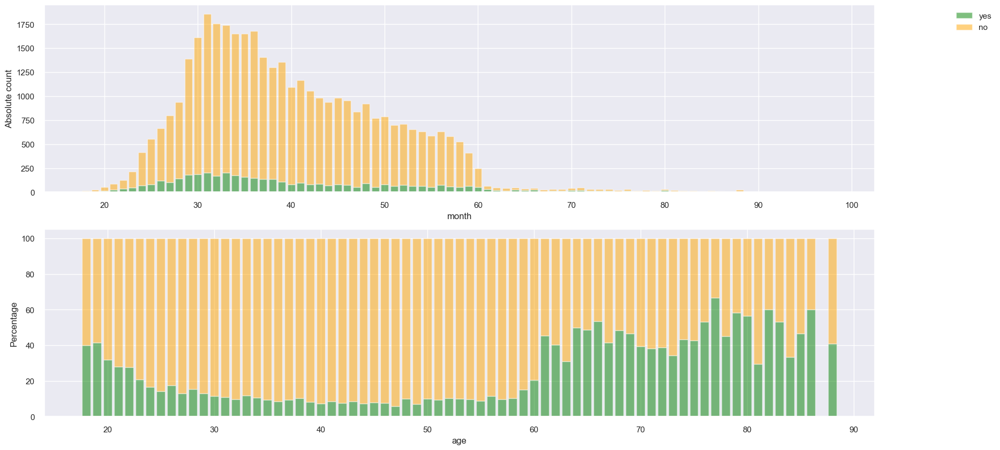

In [197]:
#Based on the predefined function we can look into the success based on the features given in the columns

choose_a_feature = bank_data_clean.loc[:, ['age', 'job', 'marital', 'duration', 'education', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'campaign', 'previous',
                                   'poutcome', 'nr.employed']].columns

print(f'Choose a feature from here: {choose_a_feature}')

#Based on the predefined function we can look into the success based on the features given in the columns
plot_bars_success('age')

## Unsupervised Machine Learning

### Preprocessing for UML

More clean up:

In [61]:
# Fixing the index
bank_data_clean.index=range(0,38245)

- We drop NaN's, we drop the "pdays" column, and we transform categorical into dummies

In [62]:
bank_data = pd.read_csv("../DE/data/Bank_marketing/bank_marketing.csv", sep=';')
#We drop this column
bank_data.drop('default', axis=1, inplace =True)
#Convert the "unknown" into "NaN":
bank_data = bank_data.replace('unknown', NaN)
#Delete missings:
bank_data_clean = bank_data.dropna(subset=['job', 'marital', 'education', 'housing', 'loan'])



#Convert the "yes"-"no" variables into 0 and 1 
#Make a copy of the old dataframe
df = bank_data_clean.copy()

#Create a copy of the dataframe with the cleaned up values:
cleaned_df = df.copy()

#Define a function that converts the no into a 0 and the yes into a 1:
def dummies_from_bool(row, col_name):
    ''' Returns 0 if value in the certain column is "no", returns 1 if value in certain column is "yes" '''
    return 1 if row[col_name] == 'yes' else 0

#Select the boolean columns (=the columns that include "yes" or "no"
bool_cols = ['housing', 'loan', 'y']

#Loop over the defined boolean columns and convert them into the boolean dtype
for col in bool_cols:
    cleaned_df[col + '_bool'] = df.apply(lambda row: dummies_from_bool(row, col),axis=1)
    
#Since we created a new columns, drop the original columns
cleaned_df = cleaned_df.drop(columns = ['housing', 'loan', 'y'])

#Based on the previous cleaned dataframe (with the boolean variables) convert categorical columns to dummies
#Choose the categorical columns:
cat_columns = ['job', 'marital', 'education', 'contact', 'month', 'day_of_week','poutcome']

#Conversion to dummies:
for col in  cat_columns:
    cleaned_df = pd.concat([cleaned_df.drop(col, axis=1),
                            pd.get_dummies(cleaned_df[col], prefix=col, prefix_sep='_',
                                            drop_first=True, dummy_na=False)], axis=1)
    
#Drop the irrelevant variable "pdays" there is almost no variation, most of the clients haven't been contacted previously
cleaned_df.drop("pdays", axis =1, inplace=True)

In [63]:
# We fix indexing here to go from 0 - 38245
cleaned_df.index=range(0,38245)

In [64]:
# Scaling
scaler = StandardScaler()

# Scaling the data
cleaned_data_scaled = scaler.fit_transform(cleaned_df)

In [65]:
# Creating a dataframe for the scaled data
cleaned_df_scaled = pd.DataFrame(cleaned_data_scaled, columns=cleaned_df.columns)
cleaned_df_scaled

,age,duration,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,housing_bool,...,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_nonexistent,poutcome_success
0,1.568527,0.010749,-0.566106,-0.348978,0.649546,0.735109,0.895747,0.713039,0.328423,-1.079245,...,1.410423,-0.336881,-0.132413,-0.115328,1.955671,-0.514749,-0.493127,-0.498079,0.395760,-0.183283
1,1.665715,-0.420370,-0.566106,-0.348978,0.649546,0.735109,0.895747,0.713039,0.328423,-1.079245,...,1.410423,-0.336881,-0.132413,-0.115328,1.955671,-0.514749,-0.493127,-0.498079,0.395760,-0.183283
2,-0.278042,-0.123976,-0.566106,-0.348978,0.649546,0.735109,0.895747,0.713039,0.328423,0.926573,...,1.410423,-0.336881,-0.132413,-0.115328,1.955671,-0.514749,-0.493127,-0.498079,0.395760,-0.183283
3,0.013522,-0.412671,-0.566106,-0.348978,0.649546,0.735109,0.895747,0.713039,0.328423,-1.079245,...,1.410423,-0.336881,-0.132413,-0.115328,1.955671,-0.514749,-0.493127,-0.498079,0.395760,-0.183283
4,1.568527,0.187815,-0.566106,-0.348978,0.649546,0.735109,0.895747,0.713039,0.328423,-1.079245,...,1.410423,-0.336881,-0.132413,-0.115328,1.955671,-0.514749,-0.493127,-0.498079,0.395760,-0.183283
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38240,3.220720,0.291746,-0.566106,-0.348978,-0.755375,2.076287,-2.219019,-1.499996,-2.840500,0.926573,...,-0.709007,2.968407,-0.132413,-0.115328,-0.511333,-0.514749,-0.493127,-0.498079,0.395760,-0.183283
38241,0.596649,0.480360,-0.566106,-0.348978,-0.755375,2.076287,-2.219019,-1.499996,-2.840500,-1.079245,...,-0.709007,2.968407,-0.132413,-0.115328,-0.511333,-0.514749,-0.493127,-0.498079,0.395760,-0.183283
38242,1.568527,-0.266399,-0.204761,-0.348978,-0.755375,2.076287,-2.219019,-1.499996,-2.840500,0.926573,...,-0.709007,2.968407,-0.132413,-0.115328,-0.511333,-0.514749,-0.493127,-0.498079,0.395760,-0.183283
38243,0.402273,0.707467,-0.566106,-0.348978,-0.755375,2.076287,-2.219019,-1.499996,-2.840500,-1.079245,...,-0.709007,2.968407,-0.132413,-0.115328,-0.511333,-0.514749,-0.493127,-0.498079,0.395760,-0.183283


### PCA

#### PCA: categorical data
Variables = Age, Job, Education, Marital

In [66]:
# Picking the categorical data, including "Age", "Job", "Education", "Marital"
pca_categorical = cleaned_df_scaled[[
       'age',
       'job_blue-collar', 'job_entrepreneur', 'job_housemaid', 'job_management', 'job_retired', 'job_self-employed', 'job_services', 'job_student', 'job_technician', 'job_unemployed',
       'marital_married', 'marital_single',
       'education_basic.6y', 'education_basic.9y', 'education_high.school', 'education_illiterate', 'education_professional.course', 'education_university.degree',
       ]]

In [67]:
# Hyperparameters & Model instantiation
model_PCA_categorical = PCA(n_components=2)

# Fitting the model with the data
model_PCA_categorical.fit(pca_categorical)

# Transforming the data (to 2 dimensions)
results_PCA_categorical = model_PCA_categorical.transform(pca_categorical)

In [68]:
# Converting results into DF
results_PCA_categorical_df = pd.DataFrame(results_PCA_categorical, columns=['PCA1', 'PCA2'])
results_PCA_categorical_df

,PCA1,PCA2
0,1.810562,0.702079
1,0.859409,-0.924298
2,0.097015,-1.393505
3,1.425087,-0.529889
4,0.821289,-0.947758
...,...,...
38240,2.877720,2.554621
38241,1.499254,0.047073
38242,1.962695,2.306139
38243,0.423489,1.837682


In [69]:
# Concatenating the results to the clean dataframe
data_clean = pd.concat([bank_data_clean, results_PCA_categorical_df], axis=1)

alt.Chart(...)

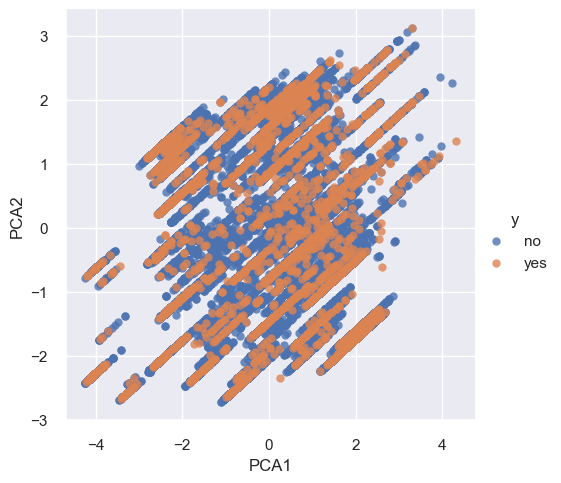

In [70]:
# Plotting the result
sns.lmplot(data=data_clean, x='PCA1', y='PCA2', hue='y', fit_reg=False)
alt.Chart(data_clean.sample(n=5000)).mark_circle(size=60).encode(
    x='PCA1',
    y='PCA2',
    color='y',
    tooltip=['age', 'education', 'marital', 'loan']
)

<AxesSubplot:>

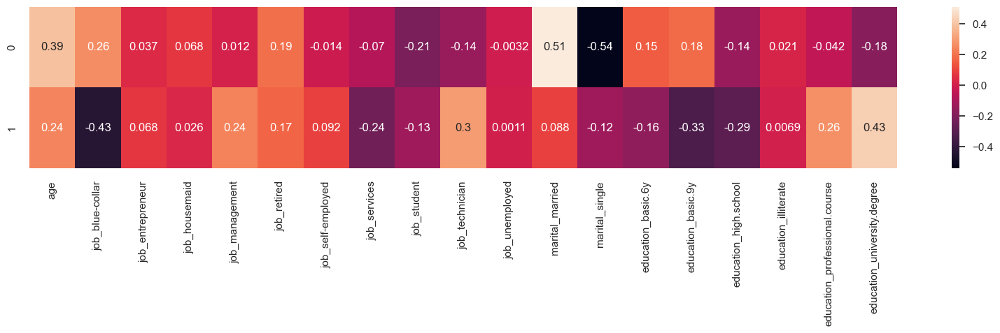

In [71]:
# Heatmap
plt.figure(figsize=[20,3])
sns.heatmap(pd.DataFrame(model_PCA_categorical.components_, columns=pca_categorical.columns), annot=True)

**Interpretation**
- PCA component 0 primarily considers the marital status
- PCA component 1 considers a combination of education (especially 'university-degree' is high) and "blue-collar" jobs

In [72]:
print("PCA component 0 explains: ", model_PCA_categorical.explained_variance_ratio_[0], "of the variance in the data")
print("PCA component 1 explains: ", model_PCA_categorical.explained_variance_ratio_[1], "of the variance in the data")
print("In total they explain: ", model_PCA_categorical.explained_variance_ratio_.sum(), "of the variance in the data")

PCA component 0 explains:  0.12218635722863766 of the variance in the data
PCA component 1 explains:  0.098169514284718 of the variance in the data
In total they explain:  0.22035587151335567 of the variance in the data


#### PCA: economic/external data
Variables = emp.var.rate, cons.price.idx, cons.conf.idx, euribor3m, nr.employed

In [73]:
# Picking the categorical data, including emp.var.rate, cons.price.idx, cons.conf.inx, euribor3m, nr.employed
pca_external = cleaned_df_scaled[['emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']]

In [74]:
# Hyperparameters & Model instantiation
model_PCA_external = PCA(n_components=2)

# Fitting the model with the data
model_PCA_external.fit(pca_external)

# Transforming the data (to 2 dimensions)
results_PCA_external = model_PCA_external.transform(pca_external)

In [75]:
# Converting results into DF
results_PCA_external_df = pd.DataFrame(results_PCA_external, columns=['PCA1_ex', 'PCA2_ex'])
results_PCA_external_df

,PCA1_ex,PCA2_ex
0,-1.320113,0.688198
1,-1.320113,0.688198
2,-1.320113,0.688198
3,-1.320113,0.688198
4,-1.320113,0.688198
...,...,...
38240,2.032388,-2.306634
38241,2.032388,-2.306634
38242,2.032388,-2.306634
38243,2.032388,-2.306634


alt.Chart(...)

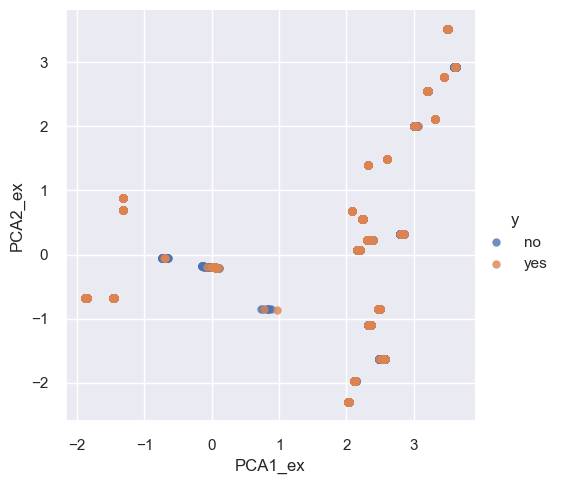

In [76]:
# Concatenating the results to the clean dataframe
data_clean = pd.concat([data_clean, results_PCA_external_df], axis=1)

# Plotting the result
sns.lmplot(data_clean, x='PCA1_ex', y='PCA2_ex', hue='y', fit_reg=False)

alt.Chart(data_clean.sample(n=5000)).mark_circle(size=60).encode(
    x='PCA1_ex',
    y='PCA2_ex',
    color='y',
    tooltip=['age', 'education', 'marital', 'loan']
)

<AxesSubplot:>

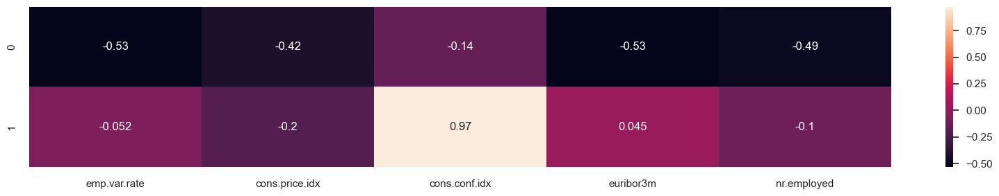

In [77]:
# Heatmap
plt.figure(figsize=[20,3])
sns.heatmap(pd.DataFrame(model_PCA_external.components_, columns=pca_external.columns), annot=True)


**Interpretation**
- PCA component 0 seems to consider 4/5 variables at a relatively high level - this might imply high correlation among these 4 varibles (multicolinearity)
- PCA component 1 considers the "consumer-confidence index" variable almost exclusively and at a really high correlation

In [78]:
print("PCA component 0 explains: ", model_PCA_external.explained_variance_ratio_[0])
print("PCA component 1 explains: ", model_PCA_external.explained_variance_ratio_[1])
print("In total they explain: ", model_PCA_external.explained_variance_ratio_.sum())

PCA component 0 explains:  0.6962321840261235
PCA component 1 explains:  0.1950704052799244
In total they explain:  0.8913025893060479


#### PCA: Campaign/sales related data
Variables = 'duration', 'campaign´, 'previous', 'contact', 'month', 'dayofweek', 'poutcome'

In [79]:
# Picking the categorical data, including emp.var.rate, cons.price.idx, cons.conf.inx, euribor3m, nr.employed
pca_campaign = cleaned_df_scaled[['duration', 'campaign', 'previous', 'contact_telephone', 'month_mar', 'month_may', 'month_jun', 'month_jul', 'month_aug', 'month_sep', 'month_oct', 'month_nov', 'month_dec', 'day_of_week_mon', 'day_of_week_tue', 'day_of_week_wed', 'day_of_week_thu', 'poutcome_nonexistent', 'poutcome_success']]

In [80]:
# Hyperparameters & Model instantiation
model_PCA_campaign = PCA(n_components=2)

# Fitting the model with the data
model_PCA_campaign.fit(pca_campaign)

# Transforming the data (to 2 dimensions)
results_PCA_campaign = model_PCA_campaign.transform(pca_campaign)

In [81]:
# Converting results into DF
results_PCA_campaign_df = pd.DataFrame(results_PCA_campaign, columns=['PCA1_cp', 'PCA2_cp'])
results_PCA_campaign_df

,PCA1_cp,PCA2_cp
0,-0.939253,1.612685
1,-0.954943,1.603321
2,-0.944156,1.609759
3,-0.954663,1.603489
4,-0.932809,1.616530
...,...,...
38240,0.261138,-1.014832
38241,0.268003,-1.010735
38242,0.200036,-1.037106
38243,0.276268,-1.005803


alt.Chart(...)

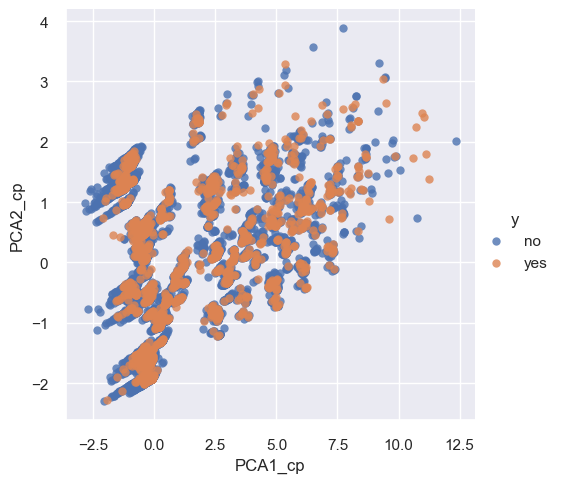

In [82]:
# Concatenating the results to the clean dataframe
data_clean = pd.concat([data_clean, results_PCA_campaign_df], axis=1)

# Plotting the result
sns.lmplot(data_clean, x='PCA1_cp', y='PCA2_cp', hue='y', fit_reg=False)

alt.Chart(data_clean.sample(n=5000)).mark_circle(size=60).encode(
    x='PCA1_cp',
    y='PCA2_cp',
    color='y',
    tooltip=['age', 'education', 'marital', 'loan']
)

<AxesSubplot:>

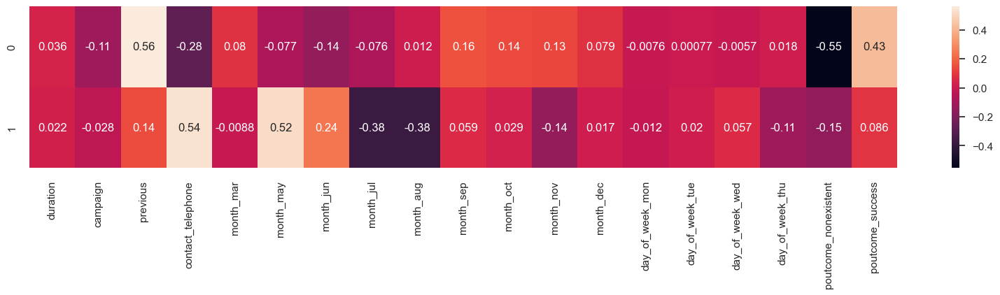

In [83]:
# Heatmap
plt.figure(figsize=[20,3])
sns.heatmap(pd.DataFrame(model_PCA_campaign.components_, columns=pca_campaign.columns), annot=True)


**Interpretation**
- PCA component 0 seems to consider 'previous' (# times client has previously been contacted) AND 'poutcome' (the outcome of the previous campaign)
- PCA component 1 mostly considers the "contact_telephone" variable AND the 'month_may' variable..

In [84]:
print("PCA component 0 explains: ", model_PCA_campaign.explained_variance_ratio_[0])
print("PCA component 1 explains: ", model_PCA_campaign.explained_variance_ratio_[1])
print("In total they explain: ", model_PCA_campaign.explained_variance_ratio_.sum())

PCA component 0 explains:  0.13270128893953842
PCA component 1 explains:  0.09154741405573466
In total they explain:  0.22424870299527308


#### PCA: all data
Variables = all variables except 'y_bool'

In [85]:
# Picking the categorical data, including..
pca_all = cleaned_df_scaled.drop('y_bool', axis=1)

In [86]:
# Hyperparameters & Model instantiation
model_PCA_all = PCA(n_components=2)

# Fitting the model with the data
model_PCA_all.fit(pca_all)

# Transforming the data (to 2 dimensions)
results_PCA_all = model_PCA_all.transform(pca_all)

In [87]:
# Converting results into DF
results_PCA_all_df = pd.DataFrame(results_PCA_all, columns=['PCA1_all', 'PCA2_all'])
results_PCA_all_df

,PCA1_all,PCA2_all
0,-1.640411,-1.478741
1,-1.534653,-1.704596
2,-1.454003,-1.372674
3,-1.623332,-1.929761
4,-1.523581,-1.679736
...,...,...
38240,1.970341,-1.175329
38241,1.497431,-1.527306
38242,2.048963,-0.684661
38243,1.581594,0.099172


alt.Chart(...)

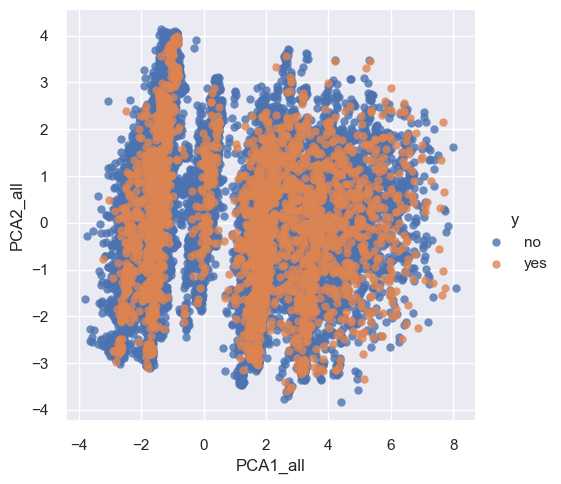

In [88]:
# Concatenating the results to the clean dataframe
data_clean = pd.concat([data_clean, results_PCA_all_df], axis=1)

# Plotting the result
sns.lmplot(data_clean, x='PCA1_all', y='PCA2_all', hue='y', fit_reg=False)

alt.Chart(data_clean.sample(n=5000)).mark_circle(size=60).encode(
    x='PCA1_all',
    y='PCA2_all',
    color='y',
    tooltip=['age', 'education', 'marital', 'loan']
)

<AxesSubplot:>

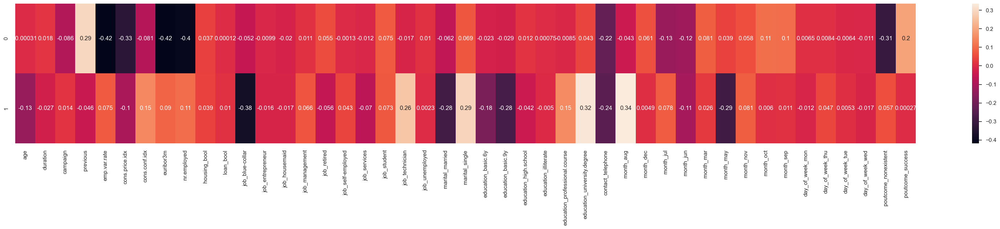

In [89]:
# Heatmap
plt.figure(figsize=[40,5])
sns.heatmap(pd.DataFrame(model_PCA_all.components_, columns=pca_all.columns), annot=True)


**Interpretation**
- PCA component 0 considers mostly economic factors, but also data on the previous campaign ('previous' and 'poutcome_nonexistent')
- PCA component 1 is split out on more variables including job, education, marital status, and month of contact

#### PCA Conclusion
- For all variations of the PCA, the visual representation of the "reduced components/features" does not reveal any clear patters in the data. Most of them produce very cloudy graphs, and they do not seem to reveal any useful information regarding the outcome variable, y.
- From the heatmap evaluations (checking the correlations between PCA-components and the input variables), it's hard still to draw any conclusion. Interestingly, the first component of the last PCA (on all variables) mostly considers the economic variables. Could this be a indication that these might be relevant explanatoy variables on the y variable (i.e., that it is not so much the characteristics of the customer, but more the economic status in the country that explains when/if people say yes/no), or is it simply due to these variables being highly correlated among each other?

In [90]:
print("PCA component 0 explains: ", model_PCA_all.explained_variance_ratio_[0])
print("PCA component 1 explains: ", model_PCA_all.explained_variance_ratio_[1])
print("In total they explain: ", model_PCA_all.explained_variance_ratio_.sum())

PCA component 0 explains:  0.10926940855297464
PCA component 1 explains:  0.05294365989922086
In total they explain:  0.1622130684521955


### NMF

#### NMF - Scaling
- NFM doesn't take negative values, thus we use the min-max scaler to get values between 0 - 1

In [91]:
# Preprocessing
scaler_min_max = MinMaxScaler()

# Scaling the data
cleaned_data_scaled_min_max = scaler_min_max.fit_transform(cleaned_df)

In [92]:
# Creating a dataframe for the scaled min-max data
cleaned_df_scaled_min_max = pd.DataFrame(cleaned_data_scaled_min_max, columns=cleaned_df.columns)
cleaned_df_scaled_min_max

,age,duration,campaign,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,housing_bool,...,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_nonexistent,poutcome_success
0,0.481481,0.053070,0.000000,0.000000,0.937500,0.698753,0.60251,0.957379,0.859735,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,0.493827,0.030297,0.000000,0.000000,0.937500,0.698753,0.60251,0.957379,0.859735,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0.246914,0.045954,0.000000,0.000000,0.937500,0.698753,0.60251,0.957379,0.859735,1.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,0.283951,0.030704,0.000000,0.000000,0.937500,0.698753,0.60251,0.957379,0.859735,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.481481,0.062424,0.000000,0.000000,0.937500,0.698753,0.60251,0.957379,0.859735,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38240,0.691358,0.067914,0.000000,0.000000,0.479167,1.000000,0.00000,0.089322,0.000000,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
38241,0.358025,0.077877,0.000000,0.000000,0.479167,1.000000,0.00000,0.089322,0.000000,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
38242,0.481481,0.038430,0.023810,0.000000,0.479167,1.000000,0.00000,0.089322,0.000000,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
38243,0.333333,0.089874,0.000000,0.000000,0.479167,1.000000,0.00000,0.089322,0.000000,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [93]:
# Picking the categorical data, including 'y'
NMF_all = cleaned_df_scaled_min_max

#### NMF: all data (including y)

In [94]:
# Instantiation of the model - 4 components
model_NMF_all = NMF(n_components=4)

# Fitting the model
model_NMF_all.fit(NMF_all)

# Transforming the data (reducing to 4 dimensions)
results_NMF_all = model_NMF_all.transform(NMF_all)

In [95]:
results_NMF_all.shape

(38245, 4)

In [96]:
model_NMF_all.components_.shape

(4, 46)

<AxesSubplot:>

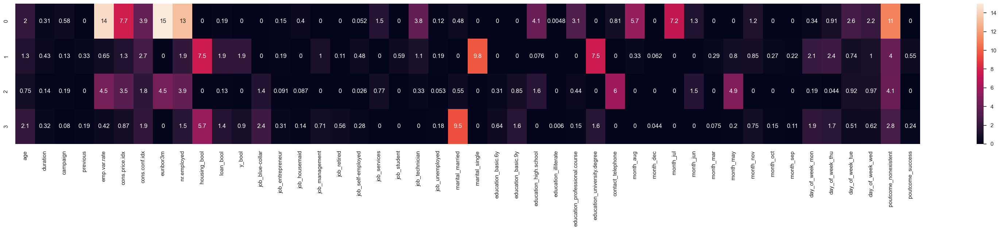

In [97]:
plt.figure(figsize=[40,5])
sns.heatmap(pd.DataFrame(model_NMF_all.components_, columns=NMF_all.columns), annot=True)

### UMAP

In [98]:
# Instantiating model, 2 dimensions (default)
model_UMAP_all = umap.UMAP()

# Fitting the data and transforming the to 2 dimensions 
embeddings_all = model_UMAP_all.fit(cleaned_df_scaled)

# Transforming
embeddings_all_results = model_UMAP_all.transform(cleaned_df_scaled)

In [99]:
# Converting results into DF
embeddings_all_df = pd.DataFrame(embeddings_all_results, columns=['UMAP1', 'UMAP2'])
embeddings_all_df

,UMAP1,UMAP2
0,12.900810,-4.665233
1,16.740345,7.491556
2,16.674154,7.373725
3,20.690434,8.172614
4,16.354429,7.104709
...,...,...
38240,-0.335794,4.903127
38241,8.829601,3.327911
38242,-0.374043,4.873274
38243,8.791908,3.348475


alt.Chart(...)

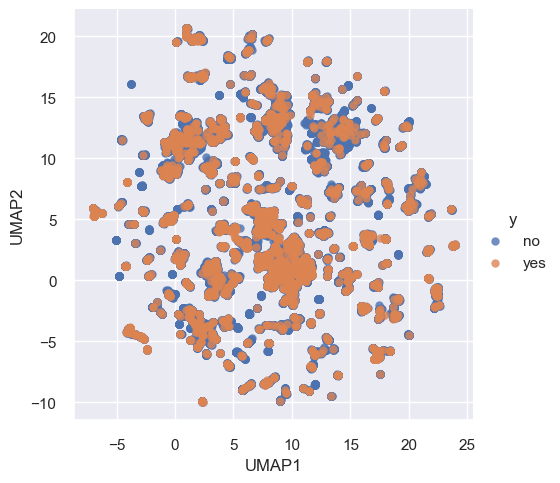

In [100]:
# Concatenating the results to the clean dataframe
data_clean = pd.concat([data_clean, embeddings_all_df], axis=1)

# Plotting the result
sns.lmplot(data = data_clean, x='UMAP1', y='UMAP2', hue='y', fit_reg=False)

alt.Chart(data_clean.sample(n=5000)).mark_circle(size=60).encode(
    x='UMAP1',
    y='UMAP2',
    color='job',
    tooltip=['age', 'education', 'marital', 'loan']
)

Interpretation
- Looking at the plot we can see lots of "sub-clusters", however they are still really spread out

### kMeans

#### Elbow Method - estimating optimal number of clusters

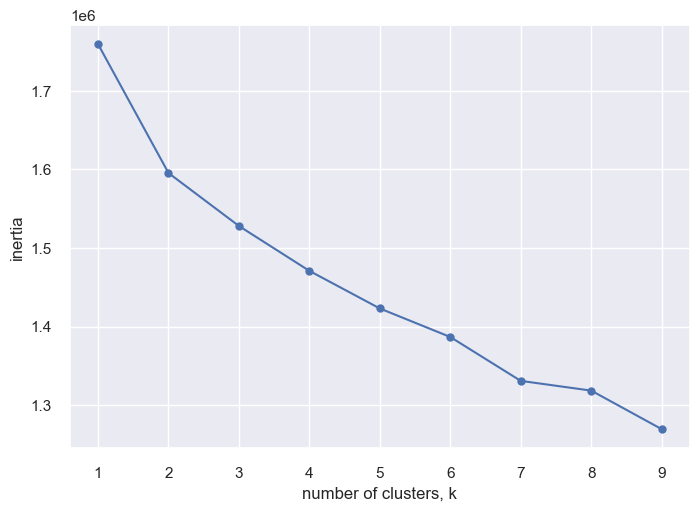

In [101]:
ks = range(1, 10)
inertias = []

for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)

    # Fit model to samples
    model.fit(cleaned_df_scaled)

    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)

# Plot ks vs inertias
plt.plot(ks, inertias, '-o')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

The curve drops a lot from 1 - 2, and not so much from there, thus it looks like 2 clusters is the optimal number
- However, we will also try to see if a few additional clusters improves the clustering results

#### kMeans - 2 clusters

In [102]:
# Instantiating the model - with 2 clusters
model_KMeans_n2 = KMeans(n_clusters=2)

# Fitting the model & predicting/assigning cluster labels
clusters_n2 = model_KMeans_n2.fit_predict(cleaned_df_scaled)

clusters_n2

array([1, 1, 1, ..., 0, 0, 0])

In [103]:
# Concatenating the clean dataset with the results (cluster labels) from k-means with 2 clusters
data_clean = pd.concat([data_clean, pd.DataFrame(clusters_n2, columns=['clustersN2'])], axis=1)

#### Exploration of the cluster results

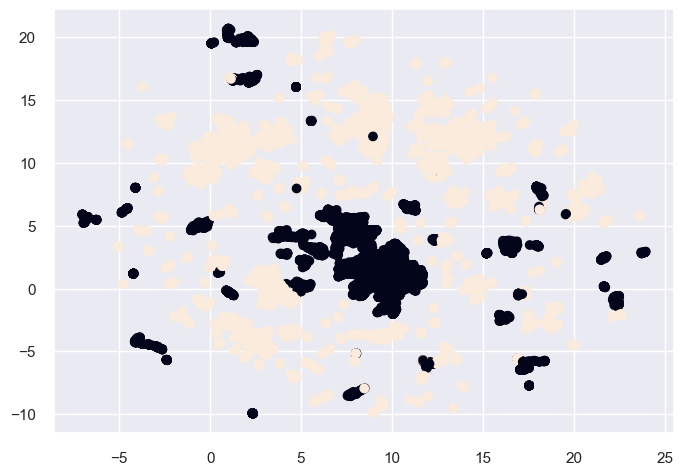

In [104]:
# Checking the clusters on our UMAP components
plt.scatter(data_clean['UMAP1'], data_clean['UMAP2'], c=data_clean['clustersN2'])

In [105]:
data_clean.groupby('clustersN2').y.value_counts()

clustersN2  y  
0.0         no     10585
            yes     1817
1.0         no     22079
            yes     1120
Name: y, dtype: int64

- The ratio of y/n is way better for cluster 0 (approx. 30%) than for cluster 1 (approx. 5%)

In [107]:
data_clean.groupby('clustersN2').marital.value_counts()

clustersN2  marital 
0.0         married      6994
            single       4052
            divorced     1356
1.0         married     14827
            single       5710
            divorced     2662
Name: marital, dtype: int64

#### kMeans - 3 clusters

In [108]:
# Instantiating the model - with 2 clusters
model_KMeans_n3 = KMeans(n_clusters=3)

# Fitting the model & predicting/assigning cluster labels
clusters_n3 = model_KMeans_n3.fit_predict(cleaned_df_scaled)

clusters_n3

array([1, 1, 1, ..., 2, 2, 2])

In [109]:
# Concatenating the clean dataset with the results (cluster labels) from k-means with 2 clusters
data_clean = pd.concat([data_clean, pd.DataFrame(clusters_n3, columns=['clustersN3'])], axis=1)

#### Exploration of the cluster results

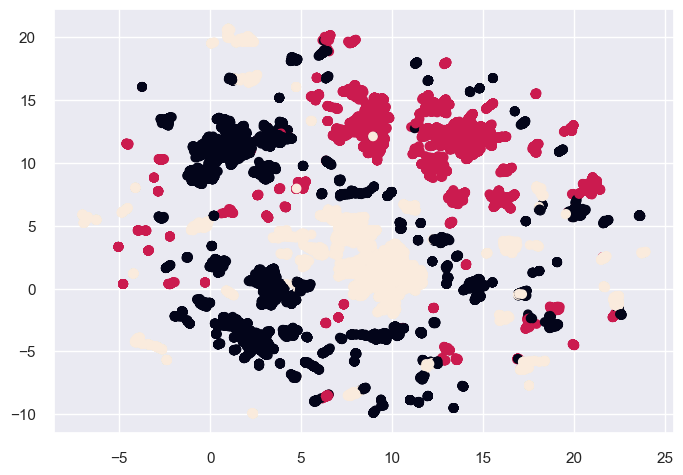

In [110]:
# Checking the clusters on our UMAP components
plt.scatter(data_clean['UMAP1'], data_clean['UMAP2'], c=data_clean['clustersN3'])

In [112]:
data_clean.groupby('clustersN3').y.value_counts()

clustersN3  y  
0.0         no     12771
            yes      793
1.0         no      9880
            yes      361
2.0         no     10013
            yes     1783
Name: y, dtype: int64

- Again, one of the clusters (cluster 1) has a really good y/n ratio = approx. 30%

In [113]:
data_clean.groupby('clustersN3').marital.value_counts()

clustersN3  marital 
0.0         married     8343
            single      3642
            divorced    1579
1.0         married     6871
            single      2199
            divorced    1171
2.0         married     6607
            single      3921
            divorced    1268
Name: marital, dtype: int64

In [114]:
data_clean.groupby('clustersN3').duration.mean()

clustersN3
0.0    246.729136
1.0    261.602871
2.0    260.003900
Name: duration, dtype: float64

- It seems like the cluster with the best y/n ratio has higher duration (i.e., the call is longer in sec's)

#### kMeans - 5 clusters

In [115]:
# Instantiating the model - with 2 clusters
model_KMeans_n5 = KMeans(n_clusters=5, random_state=1)

# Fitting the model
clusters_n5 = model_KMeans_n5.fit_predict(cleaned_df_scaled)

clusters_n5

array([0, 0, 0, ..., 1, 1, 1])

In [116]:
data_clean = data_clean.drop(['clustersN5'], axis=1)

KeyError: "['clustersN5'] not found in axis"

In [117]:
data_clean = pd.concat([data_clean, pd.DataFrame(clusters_n5, columns=['clustersN5'])], axis=1)

#### Exploration of the cluster results

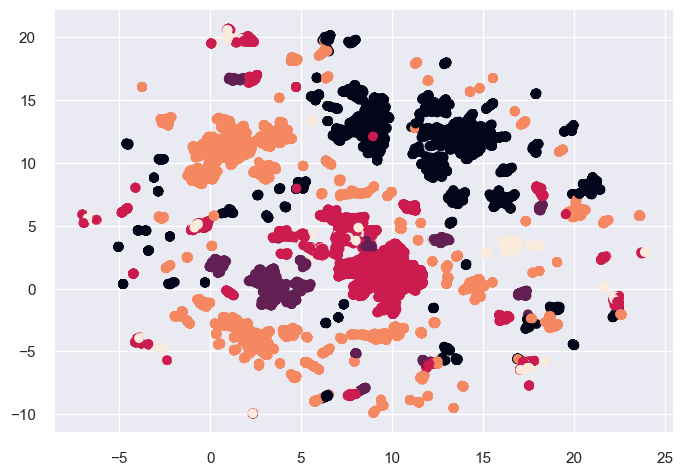

In [118]:
# Checking the clusters on our UMAP components
plt.scatter(data_clean['UMAP1'], data_clean['UMAP2'], c=data_clean['clustersN5'])

In [119]:
data_clean.groupby('clustersN5').y.value_counts()

clustersN5  y  
0.0         no     9845
            yes     360
1.0         no     3225
            yes     239
2.0         no     8596
            yes    1338
3.0         no     9768
            yes     619
4.0         no     1230
            yes     381
Name: y, dtype: int64

In [120]:
cluster_0_data = data_clean[data_clean['clustersN5'] == 0]
cluster_1_data = data_clean[data_clean['clustersN5'] == 1]
cluster_2_data = data_clean[data_clean['clustersN5'] == 2]
cluster_3_data = data_clean[data_clean['clustersN5'] == 3]
cluster_4_data = data_clean[data_clean['clustersN5'] == 4]

cluster_list = []
cluster_list.append(
  {
    'clusterName': 'cluster 0',
    'cluster_df': cluster_0_data
  }
)
cluster_list.append(
  {
    'clusterName': 'cluster 1',
    'cluster_df': cluster_1_data
  })
cluster_list.append(
  {
    'clusterName': 'cluster 2',
    'cluster_df': cluster_2_data
  })
cluster_list.append(
  {
    'clusterName': 'cluster 3',
    'cluster_df': cluster_3_data
  })
cluster_list.append(
  {
    'clusterName': 'cluster 4',
    'cluster_df': cluster_4_data
  })

In [121]:
cluster_3_data['education'].value_counts(normalize=True)

university.degree      0.316935
high.school            0.235968
professional.course    0.144219
basic.9y               0.143449
basic.4y               0.103206
basic.6y               0.055743
illiterate             0.000481
Name: education, dtype: float64

In [122]:
cluster_3_data['job'].value_counts(normalize=True)

admin.           0.276307
blue-collar      0.213247
technician       0.202561
services         0.093386
management       0.057957
self-employed    0.033022
housemaid        0.032637
retired          0.032156
entrepreneur     0.032156
unemployed       0.020410
student          0.006162
Name: job, dtype: float64

In [123]:
cluster_3_data['job'].value_counts(normalize=True)

admin.           0.276307
blue-collar      0.213247
technician       0.202561
services         0.093386
management       0.057957
self-employed    0.033022
housemaid        0.032637
retired          0.032156
entrepreneur     0.032156
unemployed       0.020410
student          0.006162
Name: job, dtype: float64

In [124]:
data_clean['job'].value_counts('normalized')

admin.           0.259825
blue-collar      0.223820
technician       0.166819
services         0.097163
management       0.071330
retired          0.041234
entrepreneur     0.035560
self-employed    0.035273
housemaid        0.025807
unemployed       0.025180
student          0.017989
Name: job, dtype: float64

In [125]:
cluster_4_data['y'].value_counts(normalize=True)

no     0.763501
yes    0.236499
Name: y, dtype: float64

In [126]:
data_clean['job'].value_counts('normalized')

admin.           0.259825
blue-collar      0.223820
technician       0.166819
services         0.097163
management       0.071330
retired          0.041234
entrepreneur     0.035560
self-employed    0.035273
housemaid        0.025807
unemployed       0.025180
student          0.017989
Name: job, dtype: float64

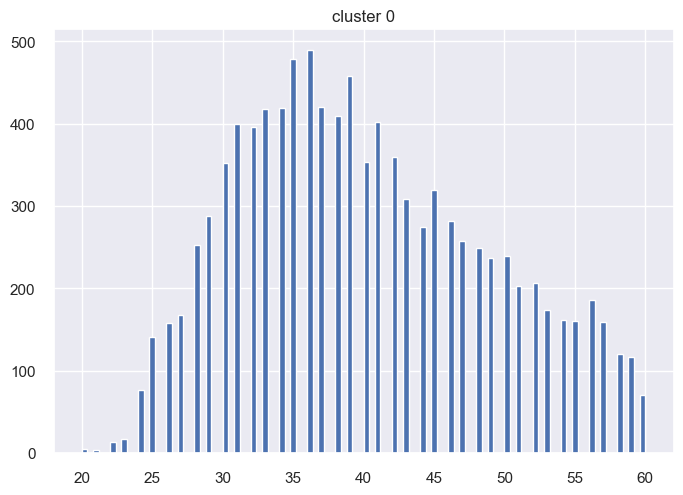

<Figure size 800x550 with 0 Axes>

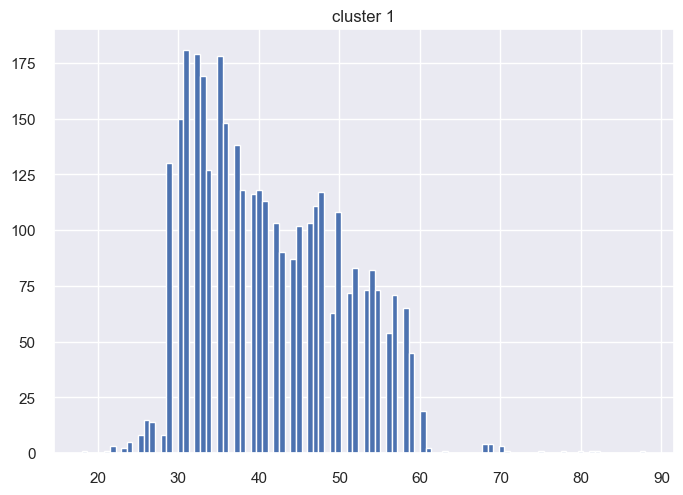

<Figure size 800x550 with 0 Axes>

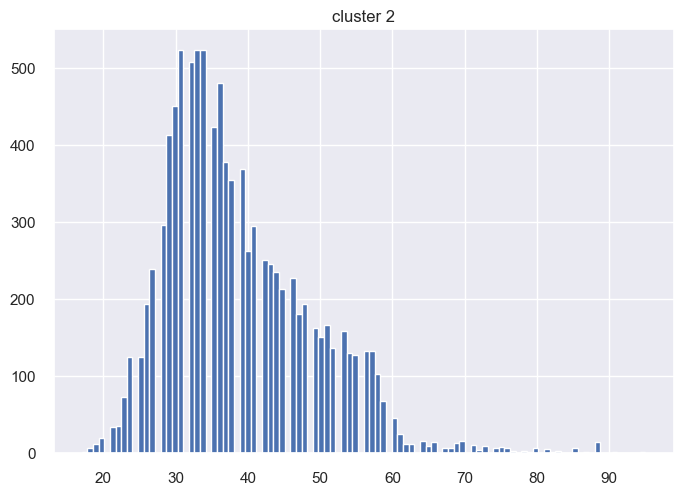

<Figure size 800x550 with 0 Axes>

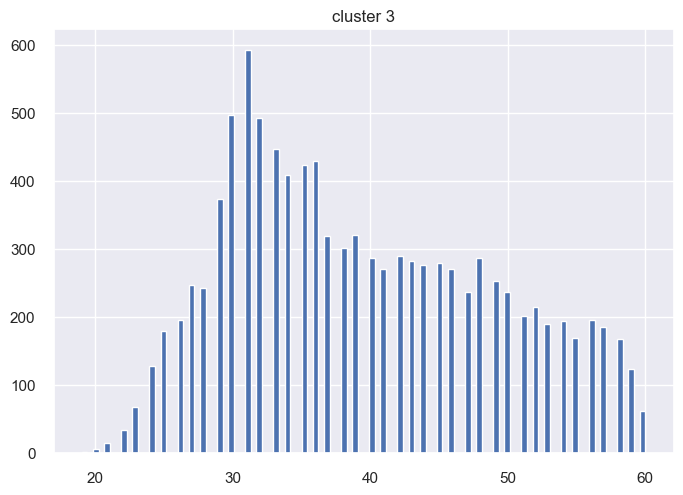

<Figure size 800x550 with 0 Axes>

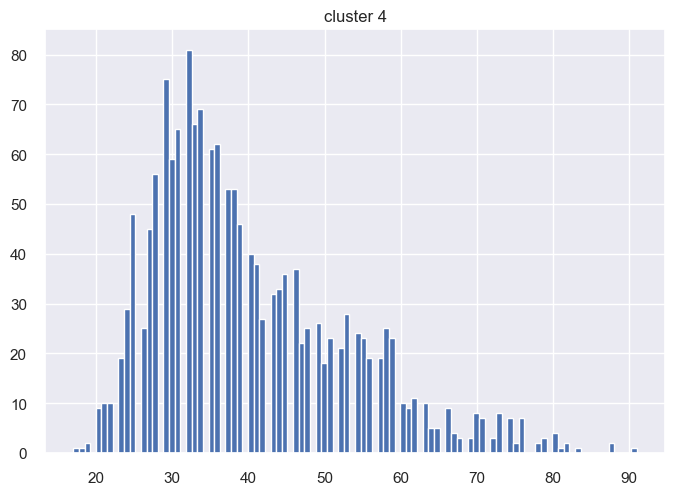

<Figure size 800x550 with 0 Axes>

In [127]:
for x in cluster_list:
  plt.hist(x['cluster_df']['age'], bins=100)
  plt.title(x['clusterName'])
  plt.figure()
  plt.show()


**Here, is an error that worked in some other Notebook, however, there were no major findings. For some insights, see the interpretation in the following.**

In [138]:
# for x in cluster_list:
#  plt.hist(x['cluster_df']['education'], orientation='horizontal', bins=25)
#  plt.title(x['clusterName'])
#  plt.figure()
#  plt.show()

In [139]:
# for x in cluster_list:
#  plt.hist(x['cluster_df']['job'], orientation='horizontal', bins=25)
#  plt.title(x['clusterName'])
#  plt.figure()
#  plt.show()

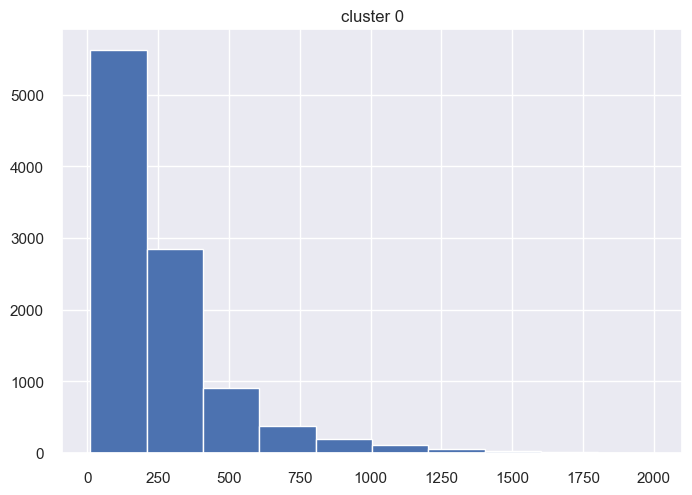

<Figure size 800x550 with 0 Axes>

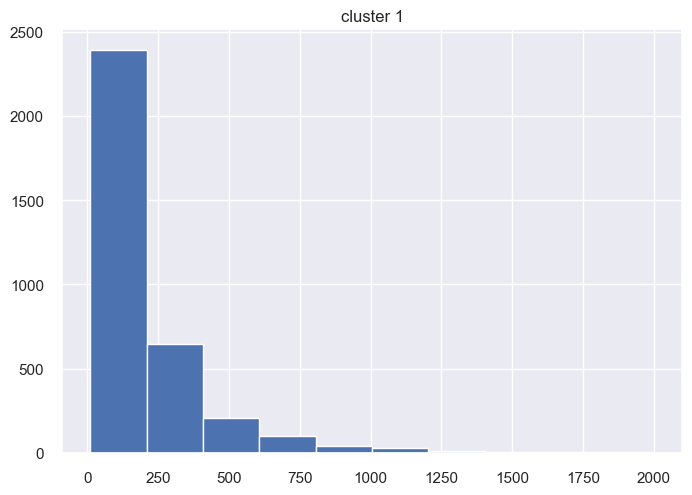

<Figure size 800x550 with 0 Axes>

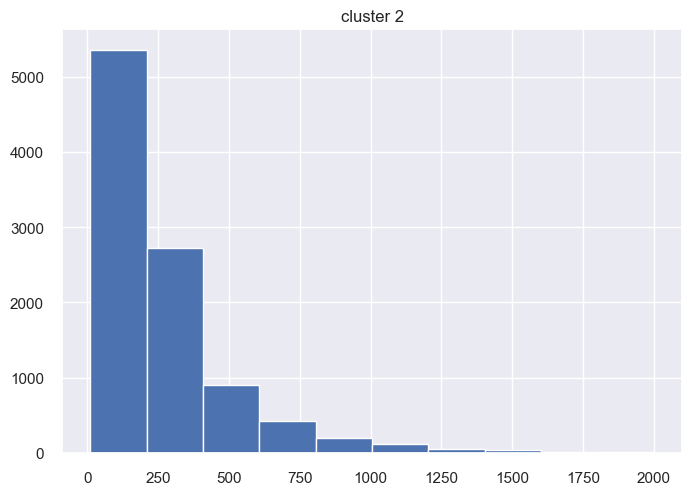

<Figure size 800x550 with 0 Axes>

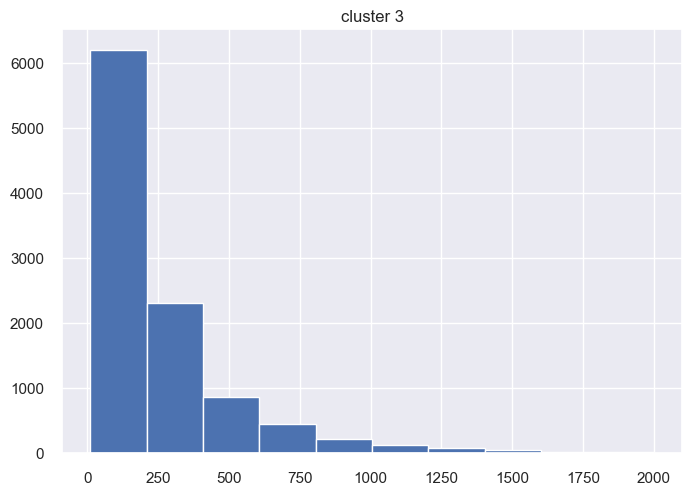

<Figure size 800x550 with 0 Axes>

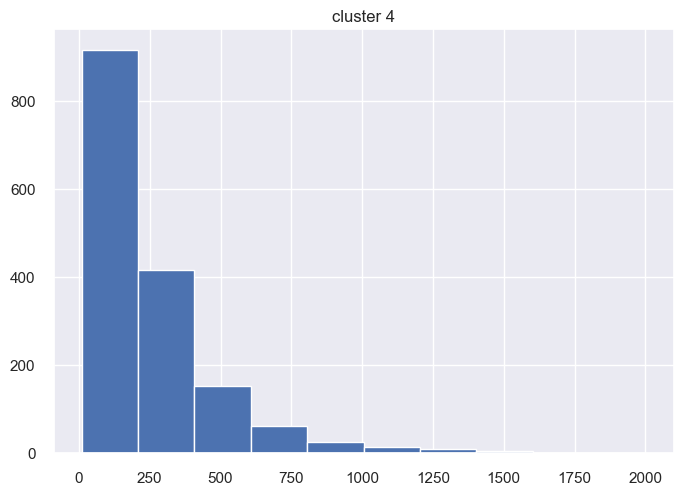

<Figure size 800x550 with 0 Axes>

In [131]:
for x in cluster_list:
 plt.hist(x['cluster_df']['duration'], range=[10,2000],)
 plt.title(x['clusterName'])
 plt.figure()
 plt.show()

In [132]:
print(cluster_0_data['duration'].median())
print(cluster_1_data['duration'].median())
print(cluster_2_data['duration'].median())
print(cluster_3_data['duration'].median())
print(cluster_4_data['duration'].median())

189.0
136.0
188.0
166.0
180.0


#### Interpretation

In Data_cleaned the two most occurring education degrees are high school and university degree representing 55% of the dataset and are the most dominant educations in all of the clusters. This is also true for job fields administrative, blue-collar and technician which represents 65% of the respondents. The age is for the most part spread out, with some clusters having high spikes in some age groups. The summary of the clusters should therefore be seen as relative to the dataset. 


-	Cluster 0 is generally made up of people with a high school diploma and university degrees with no real job variance compared to the cleaned dataset. The age of people varies from early 20’s to late 50’s with people predominantly being in their 30s and 40s and working in blue-collar and administrative fields. The cluster has a low number of students and retired respondents. 3,9% of the called people said yes to the offer and subscribed to a term deposit with a median call-duration value of 184 seconds. 

-	Cluster 1 is predominately (40%) made up of people with a university degree. The age of people varies from early 30’s to start 60’s with people predominantly being in their 30s and 40s. There are almost no people below the age of 30 in this cluster. The people are mostly working in the administrative job field, with there being a big variance compared with the cleaned data, as 15% are working with management compared to 7% in the cleaned data. 6,8% of the called people said yes to the offer and subscribed to a term deposit with a median call-duration value of 157 seconds. 

-	Cluster 2 is very similar to the normalized values in the cleaned dataset. It’s primarily made up of people with a university degree or a high school diploma. The age of people varies from early 20’s to late 80’s with people predominantly being in their 20s, 30s and 40s and working in administrative- and blue-collar fields. 18,0% said yes to the offer and subscribed to a term deposit with a median call-duration value of 192 seconds. 

-	Cluster 3 is primarily made up of people with a high school diploma or a university degree but with the third most appearing education being professional course. The age of people varies from early 20’s to late 50’s but with no real dominant age group. The job field of the cluster consist mostly of administrative workers with technicians being the second most popular field as opposed to the blue-collar field. 5,7% said yes to the offer and subscribed to a term deposit with a median call-duration value of 162 seconds. 

- Cluster 4 has the highest representation of people with a university degree (42%) 
with high school diploma and professional course being the second and third most represented education. The ages of this cluster include people in their early 20s to late 80s with people predominantly being in their 30s and 50s. The jobs of these people differ from the dataset, in that besides the administrative field, the most recurring job fields are technician, retired, management, blue-collar and students. 41,2% said yes to the offer and subscribed to a term deposit with the largest median call-duration value of 250 seconds. 


**Conclusion:** It appears, that the duration of the call has the biggest impact on the chances of people saying yes to subscribe to a long term deposit, as cluster_4, which by far has the highest amount of "yeses", also has on average the longest duration. Comparing the other elements of each cluster does not result in a meaningful information that allows us to interpret the data

## Supervised Machine Learning

Based on the given features, we want to find the best model predicting **if the client will subscribe (yes/no) a deposit (variable y).**

### Preprocessing for SML

What we need to consider first: 
- Columns with 'yes' and 'no' values are converted into boolean variables, exclude irrelevant variables
- Categorical columns are converted with the One-hot-encoder
- Define the X dataset and the y dataset
- Standardize the numerical variables
- Resample the dataset - undersampling
- Make a train-test-split

**Variable transformations:**

In [176]:
#Convert the "yes"-"no" variables into 0 and 1 
#Make a copy of the old dataframe
df = bank_data_clean.copy()

#Create a copy of the dataframe with the cleaned up values:
cleaned_df = df.copy()

#Define a function that converts the no into a 0 and the yes into a 1:
def make_bool(row, col_name):
    ''' Returns 0 if value in the certain column is "no", returns 1 if value in certain column is "yes" '''
    return 1 if row[col_name] == 'yes' else 0

#Select the boolean columns (=the columns that include "yes" or "no"
bool_cols = ['housing', 'loan', 'y']

#Loop over the defined boolean columns and convert them into the boolean dtype
for col in bool_cols:
    cleaned_df[col + '_bool'] = df.apply(lambda row: make_bool(row, col),axis=1)
    
#Since we created a new columns, drop the original columns
cleaned_df = cleaned_df.drop(columns = ['housing', 'loan', 'y'])

#Drop the variable "pdays" and "duration"
excl = ["pdays", "duration"]
cleaned_df.drop(excl, axis =1, inplace=True)

Exlcude the duration and pdays variable:

Running the models with the duration variable, shows that the duration is the second most important feature in the prediction outcome. As suggested in the text-file, this feature highly affects the output target, e.g. if duration is 0 then the outcome is "no", for sure. The duration is not known before a call is performed, but after the end of the call y is obviously known. Thus, we will discard this variable.

Also, we will exclude the pdays variable for our supervised ML as there is almost no variation, meaning that most of the clients haven't been contacted previously.

**One-Hot Encoder**

One-Hot Encoding is a technique applied to categorical variables. It creates additional features based on the number of unique values in the categorical feature. Every unique value in the category will be added as a feature.

In [178]:
#We start by dividing the data into the categorical and numerical data
df = cleaned_df.copy()

count_features = []
cat_features = []

for c in df.columns:
    if df[c].dtype == 'int64':
        count_features += [c]
    else:
        cat_features += [c]

In [179]:
#We select only a small number of the features to the OneHotEncoder
cat_features = ['job','marital', 'education', 'contact', 'month', 'day_of_week','poutcome']

In [180]:
#Creating a dense array with the onehotencoder
ohe_X = OneHotEncoder(handle_unknown='ignore', sparse=False)

#fitting the categorical features columns to the OneHotEncoder
OH_cols = pd.DataFrame(ohe_X.fit_transform(df[cat_features]))

#Changing the columns names to the names of each of the category
OH_cols.columns = list(itertools.chain(*ohe_X.categories_))

#Making the numerical data frame by dropping columns with categorical features
df_count = df.drop(cat_features, axis=1)

#Merge the data
OH_cols.index = range(len(OH_cols))
df_count.index = range(len(df_count))

cleaned_df = OH_cols.join(df_count)

**Now,** we have a dataframe where we can process the non-numerical variables.

**For the above mentioned question (see in bold),** we need to define a X and y dataset as follows:

In [181]:
#Define the X and y dataset:
X = cleaned_df.drop(columns = 'y_bool')
y = cleaned_df[['y_bool']]

**Scale the numerical variables**

In [182]:
#X = dataframe containing both numeric and categorical columns
numeric = ['age', 'emp.var.rate','cons.price.idx','cons.conf.idx', 'euribor3m', 'nr.employed', 'previous', 'campaign']
categorical = X.drop(columns = numeric).columns

#Scale
scalersml = StandardScaler()
X_numeric_std = pd.DataFrame(scalersml.fit_transform(X[numeric]), columns=numeric)

#Merge the data
X_cat = X[categorical]
X_numeric_std.index = range(len(X_numeric_std))
X_cat.index = range(len(X_cat))

X_std = X_numeric_std.join(X_cat)

**Balance the data ?**

As mentioned before, we see that the data is imbalanced. There is different ways to deal with this, and we choose to sample the data by selection only some records. This method is also known as **undersampling**. Undersampling eliminates randomly some records from the training data set belonging to the majority class (here: from the variable y the "no"). More precicely we will use the Near Miss Undersampling technique. This technique selects the data points based on the distance between majority and minority class examples with version 3, so that examples from the majority class for each closest record in the minority class are kept. We could compute this and see how the accuracy score would be affected. For now, we leave this and will chose a score that is suited for imbalanced data, such as the balanced accuracy score and the AUC score.

In [161]:
#Define the undersampling technique
#undersampling = NearMiss(version=3, n_neighbors =3)

#Transform the dataset
#X_rs, y_rs = undersampling.fit_resample(X_std,y)

**Train-test-split**

In [184]:
#Define a test-size and a random state
TEST_SIZE = 0.2
RAND_STATE = 32

#Split the dataset into a training and a test dataset:
X_train, X_test, y_train, y_test = train_test_split(X_std, y, test_size = TEST_SIZE, random_state=RAND_STATE)

### Model selection

We will run the model on three different data which are familiar from class. For evaluating all the models, the accuracy score as well as the balanced accuracy score (used for imbalanced data) is used. 

In addition, we will show the classification_report. For explanation:
- precision: the ratio of true positives to all positives, i.e., intuitively, the ability of the model not to label a negative result as positive.
- recall: the ratio of true positives to true positives plus false negatives, i.e., intuitively, the ability of the model not to label all positives.
- f1-score: a weighted harmonic mean of the precision and recall, where the F-beta score reaches its best value at 1 and worst at 0.
- support: the number of instances of each class in y_true.

After this, we will also make some predictions based on that model.

#### Logistic regression model

We choose to use the Logistic classifier as we aim to predict the probability of a categorical dependent variable, the success of the campaign ("y"). The dependent variable is a binary variable that contains data coded as 1 (yes, for successful subscription) or 0 (no, for unsuccessful subscription). This model predict the probablibity of the y=1 as a function of X, which represent the client features. This explains also how we computed the X and y (see above). We will also include a supported L1 and L2 penalities (see explanation in the Elastic Net model).

In [185]:
#Define the Logistic model
model_lg = LogisticRegression(multi_class="auto", solver='liblinear', max_iter=50)

#Fit the model to the training data
model_lg.fit(X_train, y_train)

#Prediction based on the trained data
y_pred_train = model_lg.predict(X_train)

#Predict with this model with new data, whether a client would subribe the deposit or not 
y_pred = model_lg.predict(X_test)

#Compute the accuracy score:
lg_train_accuracy_score = model_lg.score(X_train, y_train)
lg_test_accuracy_score = model_lg.score(X_test, y_test)

print('Logistic model - accuracy score from trained data' + ' ' + str(lg_train_accuracy_score))
print('Logistic model - accuracy score from test data' + ' ' + str(lg_test_accuracy_score))

#Compute the accuracy score: for a logistic regression "score" has the default accuracy score
lg_balanced_score = balanced_accuracy_score(y_test, y_pred)
print('Logistic model - balanced accuracy score' + ' ' + str(lg_balanced_score))

#Compute the AUC score
lg_auc_score = roc_auc_score(y_test, y_pred)
print('Logistic model - AUC score' + ' ' + str(lg_auc_score))

Logistic model - accuracy score from trained data 0.9006406066152438
Logistic model - accuracy score from test data 0.9014250228788077
Logistic model - balanced accuracy score 0.6187036866453779
Logistic model - AUC score 0.6187036866453779


In [186]:
#Write what we found
print("The predicted success rate based on the trained data is:", y_pred_train.sum()/len(y_pred_train)*100)
#print("Predicted value: ", y_pred[:8]) #According to our model who would subribe
print("The predicted success rate based on new data is:", y_pred.sum()/len(y_pred)*100)
#print("Actual value: ", y_test[:8]) #Who actually did subscribe
print("The actual success rate is:", y_test.sum()/len(y_pred)*100)

The predicted success rate based on the trained data is: 3.719440449731991
The predicted success rate based on new data is: 4.288142240815793
The actual success rate is: y_bool    11.295594
dtype: float64


In [187]:
#Print the classification report:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.91      0.98      0.95      6785
           1       0.67      0.25      0.37       864

    accuracy                           0.90      7649
   macro avg       0.79      0.62      0.66      7649
weighted avg       0.88      0.90      0.88      7649



#### Elastic net

This model will perform a feature selection, which could be helpful in our case. We have many client specfific and external features and not all might have enought value to explain whether a client would subscripe the deposit. 

The Elastic Net is a combination of the Lasso and the Ridge model which both target the issue of overfitting and misspecification, common problems in the linear regression models.

This is a regularization, which:
- In the regression model, a penalty term is added: $$ \text{arg min}_\beta \, \underset{\text{MSE=SSE/n}}{\underbrace{E[(y_0 - \hat{f}(x_0))^2]}} + \underset{\text{penalty}}{\underbrace{\lambda \cdot R(\beta)}}$$
- If there are too many irrelevant features, this can be solved by L1 regularization, also known as the Lasso regularization.
- If there are some coefficients that have too high values, this can be solved by L2 regularization, also known as the Ridge regularization.

In [166]:
#Define the classifier
model_el = ElasticNet()

#Train the model on the trained dataset
model_el.fit(X_train, y_train)

#Prediction based on the trained data
y_pred_train = model_el.predict(X_train)

#Predict with this model with new data, whether a client would subribe the deposit or not 
y_pred = model_el.predict(X_test)

#Compute the accuracy score:
el_train_accuracy_score = model_el.score(X_train, y_train)
el_test_accuracy_score = model_el.score(X_test, y_test)

print('Elastic net model - accuracy score from trained data' + ' ' + str(el_train_accuracy_score))
print('Elastic net model - accuracy score from test data' + ' ' + str(el_test_accuracy_score))

#Compute the accuracy score: for a logistic regression "score" has the default accuracy score
#!!!!!!!!!!!!!!! we have a binary as well as a numeric (y_pred) and does not work
#el_balanced_score = balanced_accuracy_score(y_test, y_pred)
#print('Elastic net model - balanced accuracy score' + ' ' + str(el_balanced_score))

#However, we can compute the AUC score
el_auc_score = roc_auc_score(y_test, y_pred)
print('Elastic net model - AUC score' + ' ' + str(el_auc_score))

Elastic net model - accuracy score from trained data 0.0
Elastic net model - accuracy score from test data -4.098262780094508e-05
Elastic net model - AUC score 0.5


In [167]:
#Write what we found
print("The predicted success rate based on the trained data is:", y_pred_train.sum()/len(y_pred_train)*100)
#print("Predicted value: ", y_pred[:8]) #According to our model who would subribe
print("The predicted success rate based on new data is:", y_pred.sum()/len(y_pred)*100)
#print("Actual value: ", y_test[:8]) #Who actually did subscribe
print("The actual success rate is:", y_test.sum()/len(y_pred)*100)

The predicted success rate based on the trained data is: 11.092953327232317
The predicted success rate based on new data is: 11.092953327232317
The actual success rate is: y_bool    11.295594
dtype: float64


#### XGB-model

More info on this tree-based model is: https://www.datacamp.com/tutorial/xgboost-in-python

**For the xgb model it is good to know some of the options:**
- n_estimators: number of trees you want to build
- learning_rate: step size shrinkage used to prevent overfitting. The range is [0,1]
- gamma: controls whether a given node will split based on the expected reduction in loss after the split. A higher value leads to fewer splits. Supported only for tree-based learners.
- subsample: percentage of samples used per tree. Low value can lead to underfitting.
- colsample_bytree: percentage of features used per tree. High value can lead to overfitting.
- colsample_bytree: percentage of features used per tree. High value can lead to overfitting.
- max_depth: determines how deeply each tree is allowed to grow during any boosting round.

**Other options, not applied here:**
- objective: determines the loss function to be used like reg:linear for regression problems
- reg:logistic for classification problems with only decision, binary:logistic for classification problems with probability
- alpha: L1 regularization on leaf weights. A large value leads to more regularization.
- lambda: L2 regularization on leaf weights and is smoother than L1 regularization.

**What are the defaults?**
See here: https://www.kaggle.com/general/237096

In [168]:
#Define the advanced model 
xgb = xgboost.XGBClassifier(objective='binary:logistic') #(n_estimators=100, learning_rate=0.08, gamma=0, subsample=0.75, colsample_bytree=1, max_depth=7, alpha =0.5)
#Important is we have a Logistic regression: and the default for the option "objective" is exactly that. 
#Using all the options did not make the model perform better, defaults seemed to work better

#Fit the model to the training data:
xgb.fit(X_train,y_train)

#Prediction based on the trained data
y_pred_train = xgb.predict(X_train)

#Predict with this model with new data, whether a client would subribe the deposit or not 
y_pred = xgb.predict(X_test)

#Compute the accuracy score:
xgb_train_accuracy_score = xgb.score(X_train, y_train)
xgb_test_accuracy_score = xgb.score(X_test, y_test)

print('XGBoost model - accuracy score from trained data' + ' ' + str(xgb_train_accuracy_score))
print('XGBoost model - accuracy score from test data' + ' ' + str(xgb_test_accuracy_score))


#Compute the accuracy score: for a logistic regression "score" has the default accuracy score
xgb_balanced_score = balanced_accuracy_score(y_test, y_pred)
print('XGBoost model - balanced accuracy score' + ' ' + str(xgb_balanced_score))

#However, we can compute the AUC score
xgb_auc_score = roc_auc_score(y_test, y_pred)
print('XGBoost model - AUC score' + ' ' + str(xgb_auc_score))

[10:35:50] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBoost model - accuracy score from trained data 0.9304811086416525
XGBoost model - accuracy score from test data 0.8973722055170611
XGBoost model - balanced accuracy score 0.6356096816234067
XGBoost model - AUC score 0.6356096816234068


In [169]:
#Write what we found
print("The predicted success rate based on the trained data is:", y_pred_train.sum()/len(y_pred_train)*100)
#print("Predicted value: ", y_pred[:8]) #According to our model who would subribe
print("The predicted success rate based on new data is:", y_pred.sum()/len(y_pred)*100)
#print("Actual value: ", y_test[:8]) #Who actually did subscribe
print("The actual success rate is:", y_test.sum()/len(y_pred)*100)

The predicted success rate based on the trained data is: 5.389593410903386
The predicted success rate based on new data is: 5.687017910838018
The actual success rate is: y_bool    11.295594
dtype: float64


In [170]:
#Print the classification report:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.97      0.94      6785
           1       0.59      0.30      0.40       864

    accuracy                           0.90      7649
   macro avg       0.75      0.64      0.67      7649
weighted avg       0.88      0.90      0.88      7649



#### Random Forest model

In [171]:
#Define a test-size and a random state
TEST_SIZE = 0.2
RAND_STATE = 32

#Split the dataset into a training and a test dataset:
X_train, X_test, y_train, y_test = train_test_split(X_std, y, test_size = TEST_SIZE, random_state=RAND_STATE)

In [172]:
#Define the model
model_rf = RandomForestRegressor(n_estimators=25)

#Fit the model to the train data
model_rf.fit(X_train, y_train)

#Prediction based on the trained data
y_pred_train = model_rf.predict(X_train)

#Predict with this model with new data, whether a client would subribe the deposit or not 
y_pred = model_rf.predict(X_test)
#Compute the accuracy score:
rf_train_accuracy_score = model_rf.score(X_train, y_train)
rf_test_accuracy_score = model_rf.score(X_test, y_test)

print('Random Forest model - accuracy score from trained data' + ' ' + str(rf_train_accuracy_score))
print('Random Forest model - accuracy score from test data' + ' ' + str(rf_test_accuracy_score))


#Compute the accuracy score: for a logistic regression "score" has the default accuracy score
#!!!!!!!!!!!!!!! we have a binary as well as a numeric (y_pred) and does not work; But: the rf_model will give us the probability for each client (whether they will subscribe, or not)
#rf_balanced_score = balanced_accuracy_score(y_test, y_pred)
#print('Random Forest model - balanced accuracy score' + ' ' + str(rf_balanced_score))

#However, we can compute the AUC score
rf_auc_score = roc_auc_score(y_test, y_pred)
print('Random Forest model - AUC score' + ' ' + str(rf_auc_score))

Random Forest model - accuracy score from trained data 0.8437369068332329
Random Forest model - accuracy score from test data 0.12079276725630572
Random Forest model - AUC score 0.770522360053495


In [173]:
#Write what we found
print("The predicted success rate based on the trained data is:", y_pred_train.sum()/len(y_pred_train)*100)
#print("Predicted value: ", y_pred[:8]) #According to our model who would subribe
print("The predicted success rate based on new data is:", y_pred.sum()/len(y_pred)*100)
#print("Actual value: ", y_test[:8]) #Who actually did subscribe
print("The actual success rate is:", y_test.sum()/len(y_pred)*100)

The predicted success rate based on the trained data is: 11.614216969387579
The predicted success rate based on new data is: 12.69185552176793
The actual success rate is: y_bool    11.295594
dtype: float64


#### Model comparision

In [174]:
#All in all:
print('Logistic regression model:' + ' ' + str(lg_auc_score))
print('Elastic Net model:' + ' ' + str(el_auc_score))
print('XGBoost model:' + ' ' + str(xgb_auc_score))
print('Random Forest model:' + ' ' + str(rf_auc_score))

Logistic regression model: 0.6187036866453779
Elastic Net model: 0.5
XGBoost model: 0.6356096816234068
Random Forest model: 0.770522360053495


**Model selection:** Taking the AUC score as the evaluation metric, so that we can account for the imbalance in the data, the random forest model performs best.

**Save Pickle:** Save the best model into a dump() function of the pickle. This will serialize the object and convert it into a byte stream that is saved as a file called "final_model.pkl". We see that if we saved the model in a pickle this has the advantage that the model can be run on unseen test data without retraining the model again.

In [188]:
pickle.dump(scalersml, open('scalersml.pkl', 'wb'))
pickle.dump(ohe_X, open('ohe.pkl', 'wb'))
pickle.dump(model_rf, open('final_model.pkl', 'wb'))

#Load the model to show the predicttion on new test data:
pickled_model = pickle.load(open('final_model.pkl', 'rb'))
#Test it
pickled_model.predict(X_test)

array([0.  , 0.04, 0.36, ..., 0.  , 0.52, 0.52])

### Feature importance

**Feature importance for the Random Forest model**

The importance of the features (in terms of relative importance) is plotted using yellowbrick:

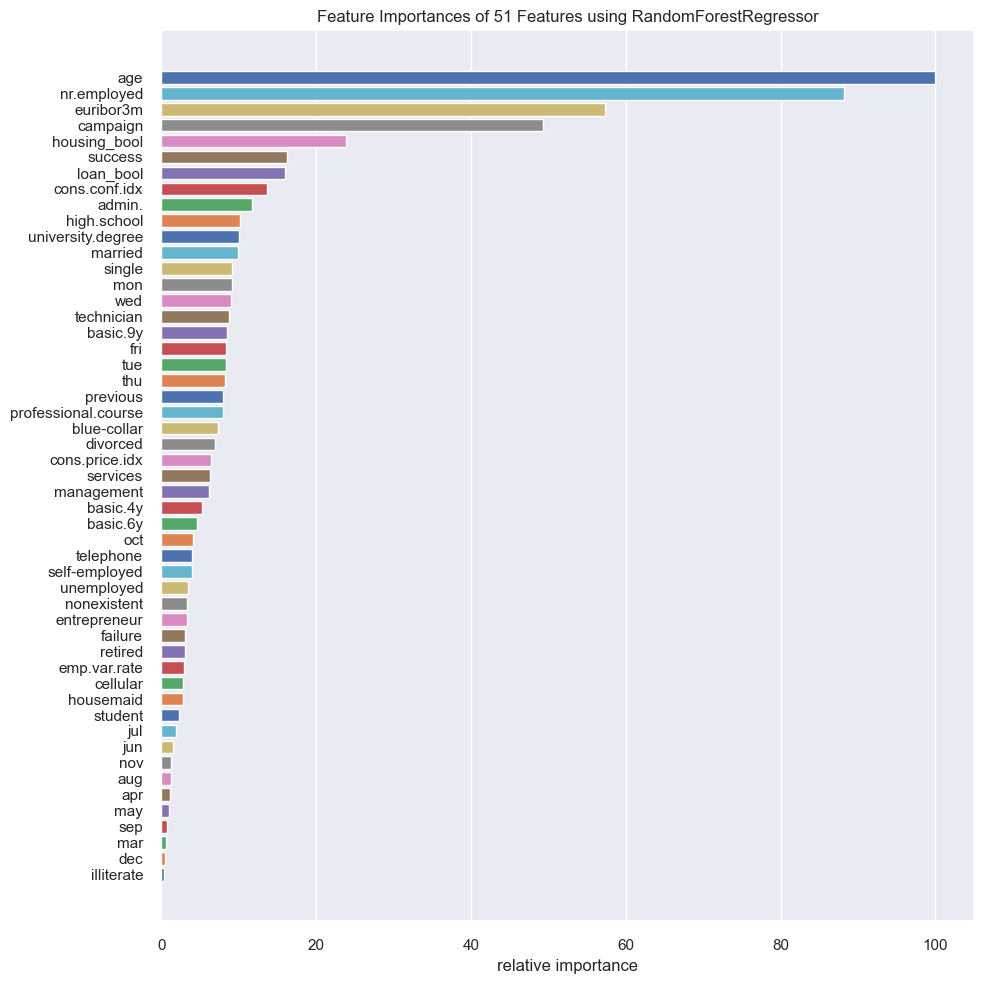

In [199]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()

viz = FeatureImportances(model_rf, ax=ax, fontsize=30)
viz.fit(X_std, y)
viz.poof()

fig.savefig('feature_importance.png', transparent=False, dpi=80, bbox_inches="tight")

From the feature importance plot, the most relevant client-related feature is the age of the client. Further, it can be inferred that external factors such as number employment, the Europe’s Libor rate (3 months), and the consumer confidece index are some of the most important features in predicting the outcome. Other relevant features are the number of contacts performed during this campaign, as well as whether a previous campaign was successful.

### Some beginning on: Hyperparameter tuning

**Hyperparameter Grid Search with the Random Forest model**

In [134]:
model_rf = RandomForestRegressor()

In [135]:
#Define a scoring metric: we choose AUC score
scorer = make_scorer(roc_auc_score) #scoring='roc_auc'

In [136]:
#Define a parameter grid for the RF model
parameters_rf = {'bootstrap': [True, False],
 'max_depth': [10, 20, None],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [2,3, 4]}

In [137]:
# erform grid search on the classifier using 'scorer' as the scoring method.
grid_obj = GridSearchCV(model_rf, parameters_rf, scoring=scorer)

In [138]:
grid_fit = grid_obj.fit(X_train, y_train)

In [139]:
# Get the estimator.
best_reg = grid_fit.best_estimator_

# Fit the new model again to the whole data
best_reg.fit(X_train, y_train)

RandomForestRegressor(max_depth=10, min_samples_split=10, n_estimators=4)

In [140]:
# Model performance on TRAIN data
best_reg.score(X_train, y_train)

0.3185658888905243

In [141]:
# Model performance on TEST data
best_reg.score(X_test, y_test)

0.2077196485615863

## Conclusion

Main findings from this project: 

- **Results from descriptives:**
    - Exploring the variable of interest, the success rate of this campaign, we see that the dataset is imbalanced, which cannot be soved by limiting some of the variables. We thought we might be able to identify with the "duration" variables some "no's" that had been in the dataset because a person immedietly hung up. However, there were not many of such cases.
    - Also, we gain first insights in some of the features with relativly higher "yeses". For example, we can observe that the "yeses" had been higher when the previous campaign was successful. In addition, we found that more youger peole have been called, but that the people youger in the age of 18-22 or older than 61 subscriped this campaign. Interesting to see is, that the lower the number of employees, the "yes" percentage was higher than when there are more employees. But again, here is to say that mostly the number of employees have been higher, meaning >5100.
    
- **Results from the Unsupervised Machine Learing:**
    - In our attempt to gain insight into the Bank Marketing dataset using UML, we firstly used StandardScaler and afterwards PCA to summarise the scaled dataset by trying to reduce the dimensionality without losing import information. PCA with two components was used on the categorical data, economic/external, sales data and lastly on all the data. For all variations of the PCA, the visual representation of the "reduced components/features" does not reveal any clear patterns in the data. Most of them produce very cloudy graphs, and they do not seem to reveal any useful information regarding the outcome variable y, that describes if the person said yes or no to the offer. 
    - After the PCA we moved on to the NMF, however, because NFM doesn't take negative values, we instead used the min-max scaler on all the data to get values between 0 - 1. Unfortunately we weren't able to extract any useful information from our heatmap evaluation. 
    - UMAP was also attempted, where we concatenated the results to the clean dataframe and visualized it. While looking at the plot, we could see lots of sub-clusters, but they were really spread out, and we were not able to make a meaningful interpretation. 
    - Moving on to clustering we used K-means. Firstly we used the so-called elbow method, to estimate the optimal number of clusters. We experimented with using 2-5 clusters, as there wasn’t an exact elbow point - ultimately we ended up using 5 clusters. Visualizing and comparing the clusters revealed alot of overlaps, and it was hard to find a big difference between them. In the end, we agreed that it was better with no clear result than bad ones, in an attempt to interpret our data fully. However, the clusters with the higher durations (i.e., the call is longer in sec's) also clearly had a better y/n ratio. The duration variable is not very useful for the prediction model in the Supervised Machine Learning part. Therefore, we will exclude this variable there.

- **Results from the Supervised Machine Learing:**
    - Model evaluation based on the AUC score: The RF performs best followed by the XGBoost model when comparing the AUC score, which is used due to the imbalanced dataset. The Logistic model including supported L1 and L2 penalities had the third best score in terms of the AUC score. 
    - Model evaluation based on the accuracy score: One flaw of the Logistic model is that the accuracy score is slightly better for the test data than for the trained data. This indicates this model might suffer from underfitting. The XGBoost model has only a minor difference in the accuracy of train and test data, and the score for the trained model is outperforming the one based on the test data. Lastly, the trained Random Forest model outperforms the model based on the test data in terms of the accuracy score, but there is a huge difference between those measures. This might be a sign of overfitting.
    - Evaluating which features were relatively important drivers for the prediction (using the best model: Random Forest model), we see that client-realated features as well as external factors were indentified as important features. The client's age has been rated as the most important feature. Other important features related to the current and previous campaign are important for the success prediction. More precicely this means it matters whether the previous campaign was successful and the number of contacts performed during this campaign. External factors such as the number of employees, the Europe’s Libor rate (3 months), and the consumer confidence index are among the most important features. Also, whether the client had a housing loan or a personal loan are strong predictors in this model.
    - Combining these information, we managed to developed a prediction model that computes the probability of how likely a client with certain features in a given setting will respond to the marketing campaign, which should help to evaluate future marketing campaigns.
    

## Outlook

Improvements for this project:
- Further exploration of under- and overfitting
- Tuning the hyperparameters 
- There are other ways how to deal with the imbalanced data e.g. resampling